<h1> The House Rocket Company Challenge </h1>

Buying a property has its advantages and disadvantages. It is necessary to know the risks of the real estate market and what to do to reduce them. After all, problems can always occur, but we must make the maximum effort to avoid them.

When a company develops a real estate venture, it hires sales and marketing professionals, that are technically prepared to show **only advantages and positive points** of the product. However, when the purpose is **to buy real estate for investments**, a deeper analysis has to be considered assuming some premises.

Thus, through these practices, real estate companies face challenges to achieve the best results in their business. And with the company **House Rocket Company** is not different.

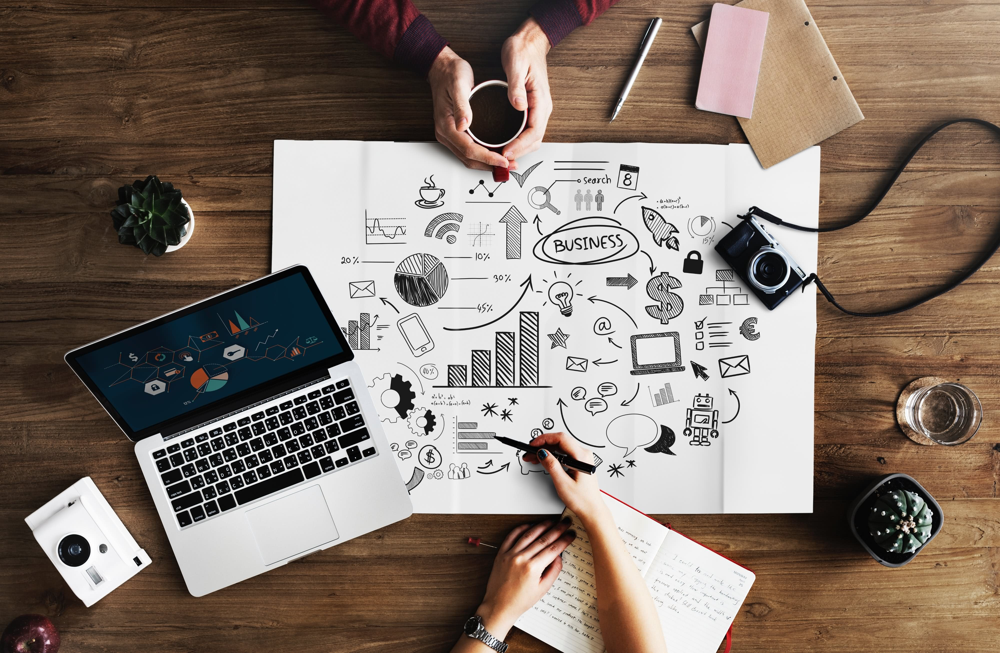

In [1]:
from IPython.display       import Image
Image('/Users/diasn/DS/House_Sales/image/casa.jpg')

House Rocket is a digital platform that has as its business model, the purchase and sale of real estate using technology.

The company, through its CEO, would like to maximize its revenue by finding good business opportunities in King County, Washington, USA. To do so, its main strategy is to buy properties in good conditions and great locations, with prices below the market, to later resell them at more attractive prices for profit. The greater the difference between the purchase and sale, the greater the company's profit and thus its revenue.

However, the houses have characteristics that make them more or less attractive to buyers and sellers. For example, the location and the internal area of the property.

Therefore, the CEO requested a **Data Exploratory Analysis** to answer three fundamental questions for future decision making. These are them:

- **Which houses should the CEO of House Rocket buy and at what price?**


- **Once the house is in the company's possession, what is the best time to sell it and what would be the sale price?**


- **House Rocket should make a renovation to increase the price of the sale? What would be the suggestions for changes?**

<h1>Presenting the Data</h1>

This work will be using the data set available in this  <a href='https://www.kaggle.com/harlfoxem/housesalesprediction'>link</a>.

<h1>Objectives</h1>

Based on the information provided in this data set, the objectives of this work besides answering the questions proposed by the CEO is:

- **Realize insights.**


- **Write possible solutions to the challenge of House Rocket Company.** 


# 0.0 Imports

## 0.1 Libraries

In [2]:
%matplotlib inline
import pandas              as pd
import numpy               as np
import math
import seaborn             as sns
import matplotlib.pyplot   as plt
import plotly.express      as px
import plotly.graph_objs   as go
import warnings

from IPython.core.display  import HTML

warnings.filterwarnings('ignore')

## 0.2 Helper Functions

In [3]:
# Setting Seaborn library style
sns.set_style('darkgrid')
sns.set_palette('muted')

pd.options.display.max_columns = 27
pd.options.display.max_rows = 999

# Setting the title and labels
def set_plots_features(ax, title, xlabel, ylabel):
    ax.set_title(title, fontsize=18)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)

In [4]:
# Filter function Region Mountains
def mont(bedrooms, bathrooms):
    filtro = montains[(montains['bedrooms']==bedrooms) & (montains['bathrooms']==bathrooms)]
    aux = filtro[['id', 'price','bedrooms', 'bathrooms', 'sqft_living', 'grade','house_basement']]
    a = round(aux['price'].mean(),2)
        
    aux1 = aux[(aux['price']<=aux['price'].mean()) & (aux['sqft_living']>=(aux['sqft_living'].mean()*0.80)) & 
               (aux['grade']>=5)]
    aux1['value below the average (%)'] = round((1 - (aux['price']/aux['price'].mean()))*100,2)
    
    print(f'Average Price: US$ {a}' )
    return aux1.sort_values(by='value below the average (%)', ascending=False)

In [5]:
# Filter function North Region
def nort(bedrooms, bathrooms):
    filtro = north[(north['bedrooms']==bedrooms) & (north['bathrooms']==bathrooms)]
    aux = filtro[['id', 'price','bedrooms', 'bathrooms', 'sqft_living', 'grade','house_basement']]
    a = round(aux['price'].mean(),2)
        
    aux1 = aux[(aux['price']<=aux['price'].mean()) & (aux['sqft_living']>=(aux['sqft_living'].mean()*0.80)) & 
               (aux['grade']>=5)]
    aux1['value below the average (%)'] = round((1 - (aux['price']/aux['price'].mean()))*100,2)
    
    print(f'Average Price: US$ {a}' )
    return aux1.sort_values(by='value below the average (%)', ascending=False)

In [6]:
# Filter function South Region
def su(bedrooms, bathrooms):
    filtro = south[(south['bedrooms']==bedrooms) & (south['bathrooms']==bathrooms)]
    aux = filtro[['id', 'price','bedrooms', 'bathrooms', 'sqft_living', 'grade','house_basement']]
    a = round(aux['price'].mean(),2)
        
    aux1 = aux[(aux['price']<=aux['price'].mean()) & (aux['sqft_living']>=(aux['sqft_living'].mean()*0.80)) & 
               (aux['grade']>=5)]
    aux1['value below the average (%)'] = round((1 - (aux['price']/aux['price'].mean()))*100,2)
    
    print(f'Average Price: US$ {a}' )
    return aux1.sort_values(by='value below the average (%)', ascending=False)

## 0.3 Loading Data

In [7]:
df = pd.read_csv('C:/Users/diasn/DS/House_Sales/data/kc_house_data.csv')

# Visualization of the data
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


## 0.4 Data Dictionary

- **id:** identificação do imóvel vendido.


- **date:** data de venda da casa.


- **price:** preço de venda de cada casa.


- **bedrooms:** número de dormitórios.


- **bathrooms:** número de banheiros.

    * Banheiro completo principal (1) - contendo banheira, chuveiro, pia e vaso.

    * Banheiro 3/4 (0.75) - contendo chuveiro, pia e vaso.

    * Lavabo (0.5) - contendo pia e vaso.


- **sqft_living:** metragem quadrada do espaço interior da habitação.


- **sqft_lot:** metragem quadrada do lote.


- **floors:** número de níveis.


- **waterfront:** valor binário representando se a residência está localizada a beira-mar ou não.


- **view:** valor de 0-4 indica a qualidade da vista.


- **condition:** valor de 0 a 5 indica a condição da casa.

  - 1 = Pobre - Desgastado. Reparos e revisões necessárias em superfícies pintadas, coberturas, encanamentos, aquecimento e inúmeras inadequações funcionais. Manutenção e abuso diferidos excessivos, valor em uso limitado, abandono próximo ou reconstrução importante; reutilização ou mudança de ocupação é iminente. A idade efetiva está próxima do final da escala, independentemente da idade cronológica real.
  
  - 2 = Muito mal vestido. Muito reparo necessário. Muitos itens precisam de retoque ou revisão, manutenção adiada óbvia, utilidade e sistemas inadequados de construção, todos diminuindo a expectativa de vida e aumentando a idade efetiva.
  
  - 3 = Média - Algumas evidências de manutenção diferida e obsolescência normal com a idade, pois são necessários alguns pequenos reparos, além de bom - Não é necessária manutenção óbvia, mas nem tudo é novidade. Aparência e utilidade estão acima do padrão e a idade efetiva geral será menor que a propriedade típica e alguns retoques. Todos os principais componentes ainda funcionam e contribuem para uma expectativa de vida estendida. A idade e utilidade efetivas são padrão para propriedades semelhantes de sua classe e uso.
  
  - 4 = Bom - Não é necessária manutenção óbvia, mas nem tudo é novidade. Aparência e utilidade estão acima do padrão e a idade efetiva geral será menor que a propriedade típica.
  
  - 5 = Muito bom - Todos os itens são bem mantidos, muitos foram revisados ​​e reparados por apresentarem sinais de desgaste, aumentando a expectativa de vida e diminuindo a idade efetiva com pouca deterioração ou obsolescência evidente com alto grau de utilidade.


- **grade:** valor de 1 a 13 indica a qualidade de construção e acabamento do imóvel: 1-3 fica aquém da construção civil; 7 tem um nível médio de construção e design ; 11- 13 têm um alto nível de qualidade de construção e design.


- **sqft_above:** área superior ao porão


- **sqft_basement:** área do porão.


- **yr_built:** ano de construção.


- **yr_renovated:** ano de reforma.


- **zipcode:** código postal.


- **lat:** latitude.


- **long:** longitude.


- **sqft_living15 :** área do espaço de habitação interior para os 15 vizinhos mais próximos. 


- **sqft_lot15:** área dos lotes dos 15 vizinhos mais próximos.



# 1.0 Data Description

To begin with, we will familiarize ourselves with the data set by describing the data, that is, we will explore the characteristics of the data and work with the following topics below:


- Data Dimensions


- Data Types


- Check NAN


- Data Change


- Descriptive Statistics


- Location of Properties

However, before proceeding, at each stage completed, we will make a copy of the data set so as not to lose what has already been done. This procedure makes the work much easier in case something goes wrong with the code.

In [8]:
# Copy the data set
df1 = df.copy()

## 1.1 Data Dimensions

In this step, we will find out the number of rows and columns of the data to know the real size of the dataset. This way, we can identify the dimension of the data by applying the `shape` command. 

In [9]:
print(f'Number of rows:{df1.shape[0]}')
print(f'Number of cols:{df1.shape[1]}')

Number of rows:21613
Number of cols:21


Looking at the records above, we see that the dataset has about 21613 properties with 21 characteristics each. It is not a large dataset that requires the use of any server or **cloud**.

## 1.2 Data Type

The next step to consider is about the types of data that we are dealing with, because it is of fundamental importance to know the aspect of each one.

In [10]:
df1.dtypes

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

Analyzing the data types, we understand that the variables `date`, `bathrooms`, `waterfront` and `condition` need to be modified, because they are not in the ideal format. The `date` variable is in *object* format and must be transformed to *datetime*.


The `bathrooms` column, which is of the float type, is categorized in the USA considering each accessory as 1/4 of the bathroom, this is explained in the subitem **Data Dictionary**. Therefore, to facilitate the bathroom count at the time of Data Exploratory Analysis, we will transform the attribute into *interger* considering the rounding of real numbers always for more. 


For the attribute `waterfront`, we will convert the binary numbers (1 and 0) only to Yes and No. And finally, `condition` will receive the names of the categories that each number represents according to the **Data Dictionary**.

In [11]:
# Converting date variable to datetime
df1['date'] = pd.to_datetime(df1['date'])

# Converting Bathrooms to Units
df1['bathrooms'] = df1['bathrooms'].apply(lambda x: 1 if x==0.5 else math.ceil(x))

# Convertendo vista para agua
df1['waterfront'] = df1['waterfront'].apply(lambda x: 'no' if x==0 else 'yes')

# Convertendo condição
condition = {1 : 'Pobre', 2: 'Justo', 3: 'Média', 4: 'Bom', 5: 'Muito Bom'}
df1['condition'] = df1['condition'].map(condition)

## 1.4 Check NAN

The next data treatment we will do is the identification of the NAN. It is important to fill in all the NANs in the data set so as not to interfere with the data analysis. 

Generally, some techniques are used to fill this data, such as the average, the median or even some solution thinking about the business issue. However, to verify this data, we going to use the `isnull().sum()` command.

In [12]:
df1.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

Apparently, observing the result above there is no missing data in the data set. This is a good indication, because the data for this analysis are complete.

## 1.5 Data Change

When changing the data types, we will check the data again to find out if there were any relevant changes when they were addressed in sub-item 1.2. More specifically, we would like to know what happened to the data types `date`, `bathrooms` and `waterfront` when modified. 
And also, we will change the characteristic of the `grade` data to *object*, since, each number represents a category according to the **Data Dictionary**.

In [13]:
df1['grade'] = df1['grade'].astype(object)

In [14]:
# Checking data types
df1.dtypes

id                        int64
date             datetime64[ns]
price                   float64
bedrooms                  int64
bathrooms                 int64
sqft_living               int64
sqft_lot                  int64
floors                  float64
waterfront               object
view                      int64
condition                object
grade                    object
sqft_above                int64
sqft_basement             int64
yr_built                  int64
yr_renovated              int64
zipcode                   int64
lat                     float64
long                    float64
sqft_living15             int64
sqft_lot15                int64
dtype: object

We can verify above that the features have been correctly transformed.

## 1.6 Descriptive Statistics

Descriptive Statistics is the area that aims to summarize and describe any set of data. In other words, it is that statistic that is concerned with synthesizing the data in a direct way, worrying about fewer variations and confidence intervals of the data. Therefore, at this stage, what we will do is to understand the characteristics of the data through this analysis.

In [15]:
# Description of the variable date
df1['date'].describe()

count                   21613
unique                    372
top       2014-06-23 00:00:00
freq                      142
first     2014-05-02 00:00:00
last      2015-05-27 00:00:00
Name: date, dtype: object

Above, we have the characteristic of the variable `date`. We can see that the attribute has the sales records of the 21613 properties, being the first sale on 2014-05-02 and the last on 2015-05-27. Therefore, the data set has records for one year and 15 days.

We will perform the descriptive statistics only of the numerical attributes and categorical attributes that we consider most relevant. This way, columns like `date`, `id`, `zipcode`, `waterfront`, `lat` and `long`, `sqft_living15` and `sqft_lot15` will be removed to make the information more organized.

### 1.6.1 Numerical Attributes

In [16]:
# Numerical Attributes
num_atr = df1.select_dtypes(exclude=['datetime64[ns]', 'object'])
num_atr.columns

Index(['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'view', 'sqft_above', 'sqft_basement', 'yr_built',
       'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

In [17]:
# Excluindo as colunas 'id', 'codigo', 'lat', 'long', 'visualizacao', 'areainterna15', 'arealote15'
est = df1.drop(['id', 'zipcode', 'lat', 'long', 'view', 'sqft_living15', 'sqft_lot15'], axis = 1)

In [18]:
est.describe().T

,count,mean,std,min,25%,50%,75%,max
price,21613.0,540088.141767,367127.196483,75000.0,321950.0,450000.0,645000.0,7700000.0
bedrooms,21613.0,3.370842,0.930062,0.0,3.0,3.0,4.0,33.0
bathrooms,21613.0,2.439273,0.923593,0.0,2.0,3.0,3.0,8.0
sqft_living,21613.0,2079.899736,918.440897,290.0,1427.0,1910.0,2550.0,13540.0
sqft_lot,21613.0,15106.967566,41420.511515,520.0,5040.0,7618.0,10688.0,1651359.0
floors,21613.0,1.494309,0.539989,1.0,1.0,1.5,2.0,3.5
sqft_above,21613.0,1788.390691,828.090978,290.0,1190.0,1560.0,2210.0,9410.0
sqft_basement,21613.0,291.509045,442.575043,0.0,0.0,0.0,560.0,4820.0
yr_built,21613.0,1971.005136,29.373411,1900.0,1951.0,1975.0,1997.0,2015.0
yr_renovated,21613.0,84.402258,401.679240,0.0,0.0,0.0,0.0,2015.0


In this table, we will make interesting observations in order to formulate, and even confirm, fundamental hypotheses that resolve the questions.

Thus, analyzing the answer variable, `price`, one notices that the cheapest house cost 75,000 and the most expensive house 7,700,000. Also, the target variable has a median of 450,000 and an average of 540,088, which means that the price has no normal distribution.

Another fact that calls attention is the **minimum number of `bathrooms` and `bedrooms`**, because it is **null**. Generally, this can be some data set error because it is impossible to build any standard house without one of these compartments, taking into consideration the size of the lots and the internal area that these houses have. Therefore, in the following sections, this data will be better analyzed.

The variable `sqft_above`, which means the same footage as the `sqft_living`, but without the presence of a basement, has its smallest house with an area of 290 m² and the largest house has 9410 m². And an average of 1788.39 m². Really these houses are big. The feature `sqft_basement` concluded that many of the houses have no basement, because the zero metric indicates this.

Checking the variable `yr_built`, it is stated that the oldest houses in the county, were built in 1900 and the most recent are from 2015. And finally, the feature `yr_renovated` only informs the year in which the houses were remodeled, but through this picture it is not possible to draw any conclusions. 

Therefore, in this context, I try to explore the **features** by asking questions like: What are the characteristics that influence the price of this house? What raises the price of these properties: number of bedrooms, bathrooms?

From then on, based on this information, I correlate these other variables that influence the formation of the price. Therefore, I will analyze the other data taking this criterion at the moment the formulated hypotheses are validated.

### 1.6.2 Categorical Attributes

In [19]:
# Selecting categorical attributes
cat_atr = df1.select_dtypes(exclude=['datetime64[ns]', 'int64', 'float64'])

# Listing categorical attribute columns
cat_atr.columns

Index(['waterfront', 'condition', 'grade'], dtype='object')

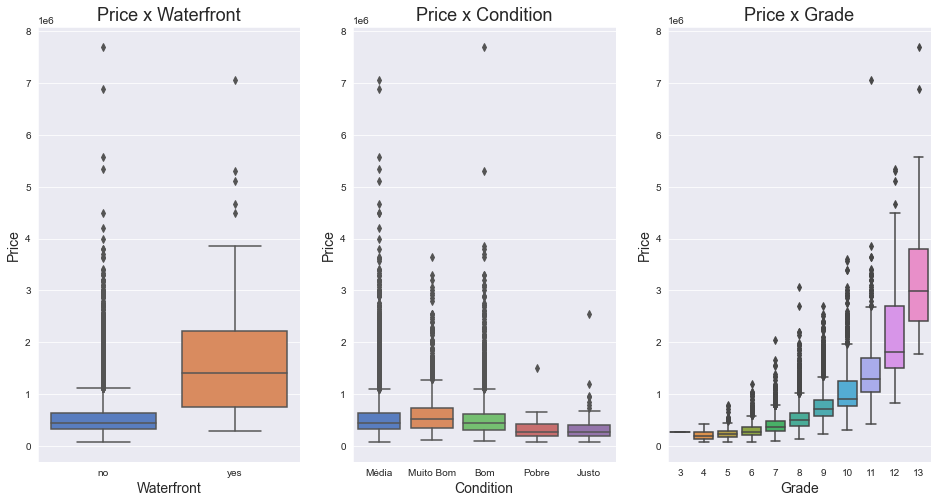

In [20]:
# Restrigindo conjunto de dados, desconsiderando quartos e banheiros nulos
aux1 = df1[(df1['bedrooms'] != 0) & (df1['bathrooms'] != 0)]

fig, gr = plt.subplots()

# Tamanho da Figura
gr.figure.set_size_inches(16,8)

# Plotando boxplots 
plt.subplot(1,3,1)
gr = sns.boxplot( x = 'waterfront', y = 'price', data=aux1)
set_plots_features(gr, 'Price x Waterfront', 'Waterfront', 'Price' )

plt.subplot(1,3,2)
gr = sns.boxplot( x = 'condition', y = 'price', data=aux1)
set_plots_features(gr, 'Price x Condition', 'Condition', 'Price' )

plt.subplot(1,3,3)
gr = sns.boxplot( x = 'grade', y = 'price', data=aux1)
set_plots_features(gr, 'Price x Grade', 'Grade', 'Price')

plt.show()

**Observations:**


* Houses by waterfront have a higher median than houses without water views. Also, the first quartile of houses with water views are more valued than the third quartile of houses without water views, but it can be seen that there are many outliers in houses that do not have water views.


* The conditions of medium, good and very good houses stand out more, since there is little difference between their medians. Average condition homes have an equivalent median with good condition homes. Note also the presence of outliers.


* We can see in the graph that there is an exponential growth, because as the note of the houses increases, the price increases.


## 1.7 Location of Properties 

At this stage, we will locate on the map where the houses of the data set are.

In [21]:
fig = px.scatter_mapbox(df1, lat="lat", lon="long", color='price', size='price',
                        color_continuous_scale=px.colors.sequential.RdBu, zoom=7, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

We can see that there is a higher concentration of properties in the North/Seattle region. There are also houses that are concentrated in the south. And finally, few houses are further away from the urban centers, real estate that is in the Mountain Region. Therefore, for a more elaborate exploratory analysis of the data, we will divide the observations by regions, being: North/Seattle region, South region and Mountain region.

# 2.0 Feature Engineering

## 2.1 Creating Mental Map of Hypotheses 

With some guidelines defined on how we will do the exploratory data analysis, we will start to create some hypotheses using a **Mental Map of Hypotheses**. This step is extremely important because it will help to organize the ideas in a simpler and more efficient.

Therefore, in the image below, we put characteristics, requirements of which we believe to be important at the moment we evaluate the purchase or sale of a property.

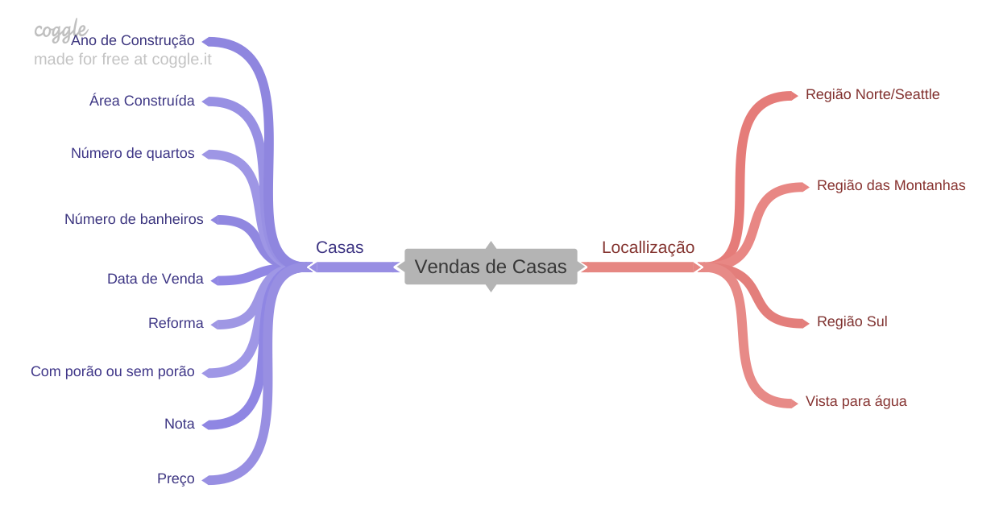

In [22]:
Image('C:/Users/diasn/DS/House_Sales/image/Vendas_de_Casas.png')

Looking at the image above, we put as central filter the **sale of houses**, because we are trying to answer the questions that CEO proposed. Therefore, we deemed it necessary to evaluate two requirements for the sale of a property. In the case: characteristics about the house and the location.


Elaborating the reasoning in this way, we try to put coherent information in each requirement of what is evaluated in the real estate market.


Therefore, from this **Mental Map**, we will create the respective hypotheses.

## 2.2 Creating Hypotheses

Based on the **Mental Map of Hypotheses**, we made the following hypotheses for validation:

**1.** Old houses should be less valued.


**2.** Houses with a larger area should be more valued.


**3.** Houses with more bedrooms should be more valued.


**4.** Houses with more bathrooms should be more valued.


**5.** Retired houses should be valued more.


**6.** Houses with basements should be valued more.


**7.** Houses with more conditions should be more valued.


**8.** Houses with higher grades should be valued more.


**9.** Waterfront houses should be more valued.


**10.** Summer should be the season that sells most houses.


**11.** Houses in the North/Seattle region should be valued more than houses in the Mountains and South region.

## 2.3 Featuring Engineering

With the creation of the hypotheses already made, in this step we will make the process of **Feature Engineering**, that is, we will create new variables based on what has already been analyzed in the *descriptive statistics* and the *creation of the respective hypotheses*. But first, as module 1 has been finalized, we will save a copy of the data set in order not to lose what has already been done.

In [23]:
# Salving copy of the data set
df2 = df1.copy()

As one of the questions is to answer the best time to buy a property, we will create two features based on the year and month of sale that the houses occurred.

In [24]:
# Year of the sale
df2['year_sale'] = df2['date'].dt.year

# month of the sale
df2['month_sale'] = df2['date'].dt.month

The next features to be elaborated refer to the houses that have been renovated and have basement. No matter how much the data set gives us this information, we will create categorical variables.

In [25]:
# Reforma Casa
df2['reform_house'] = df2['yr_renovated'].apply(lambda x: 'yes' if x > 0 else 'no')

# Casa_com_porão
df2['house_basement'] = df2['sqft_basement'].apply(lambda x: 'yes' if x > 0 else 'no')

And as it was previously decided to do the data analysis by region, we will create the feature "region" to obtain the number of houses that belong to each sector.

In [26]:
df2['region'] = df2.apply(lambda x: 'North/Seattle' if (x['lat'] > 47.5) & (x['long'] < -121.805)
                         else 'South' if (x['lat'] < 47.5) & (x['long'] < -121.805) else 'Montains', axis=1)

Finally, we can check the data set with the new columns created.

In [27]:
df2.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sale,month_sale,reform_house,house_basement,region
0,7129300520,2014-10-13,221900.0,3,1,1180,5650,1.0,no,0,Média,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,no,no,North/Seattle
1,6414100192,2014-12-09,538000.0,3,3,2570,7242,2.0,no,0,Média,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,yes,yes,North/Seattle
2,5631500400,2015-02-25,180000.0,2,1,770,10000,1.0,no,0,Média,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,2015,2,no,no,North/Seattle
3,2487200875,2014-12-09,604000.0,4,3,1960,5000,1.0,no,0,Muito Bom,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,2014,12,no,yes,North/Seattle
4,1954400510,2015-02-18,510000.0,3,2,1680,8080,1.0,no,0,Média,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,2015,2,no,no,North/Seattle


# 3.0 Filtering Variables

In this module, we will filter the variables, that is, we will analyze the dataset to identify if it is possible to restrict any data that is not relevant for exploratory data analysis by performing the following steps:


* Filtering Rows


* Selecting Columns


However, as a procedure already established, we will save a copy of the data set before starting the activities.

In [28]:
# Saving copy of the data set
df3 = df2.copy()

## 3.1 Filtering Rows

Let's start by filtering the lines. And the first analysis are the houses that have zero number of bathrooms or rooms, as reported in module 1, in the descriptive statistics topic.

In [29]:
# Analyzing houses with null bathrooms and rooms
df3[(df3['bedrooms']==0)]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sale,month_sale,reform_house,house_basement,region
875,6306400140,2014-06-12,1095000.0,0,0,3064,4764,3.5,no,2,Média,7,3064,0,1990,0,98102,47.6362,-122.322,2360,4000,2014,6,no,no,North/Seattle
3119,3918400017,2015-02-05,380000.0,0,0,1470,979,3.0,no,2,Média,8,1470,0,2006,0,98133,47.7145,-122.356,1470,1399,2015,2,no,no,North/Seattle
3467,1453602309,2014-08-05,288000.0,0,2,1430,1650,3.0,no,0,Média,7,1430,0,1999,0,98125,47.7222,-122.290,1430,1650,2014,8,no,no,North/Seattle
4868,6896300380,2014-10-02,228000.0,0,1,390,5900,1.0,no,0,Justo,4,390,0,1953,0,98118,47.5260,-122.261,2170,6000,2014,10,no,no,North/Seattle
6994,2954400190,2014-06-24,1295650.0,0,0,4810,28008,2.0,no,0,Média,12,4810,0,1990,0,98053,47.6642,-122.069,4740,35061,2014,6,no,no,North/Seattle
8477,2569500210,2014-11-17,339950.0,0,3,2290,8319,2.0,no,0,Média,8,2290,0,1985,0,98042,47.3473,-122.151,2500,8751,2014,11,no,no,South
8484,2310060040,2014-09-25,240000.0,0,3,1810,5669,2.0,no,0,Média,7,1810,0,2003,0,98038,47.3493,-122.053,1810,5685,2014,9,no,no,South
9773,3374500520,2015-04-29,355000.0,0,0,2460,8049,2.0,no,0,Média,8,2460,0,1990,0,98031,47.4095,-122.168,2520,8050,2015,4,no,no,South
9854,7849202190,2014-12-23,235000.0,0,0,1470,4800,2.0,no,0,Média,7,1470,0,1996,0,98065,47.5265,-121.828,1060,7200,2014,12,no,no,North/Seattle
12653,7849202299,2015-02-18,320000.0,0,3,1490,7111,2.0,no,0,Média,7,1490,0,1999,0,98065,47.5261,-121.826,1500,4675,2015,2,no,no,North/Seattle


We can verify that there are some houses with bathrooms and rooms **null**. For example, a house that costs $1,095,000 has no bathroom and no bedroom and has 4 floors is not something conventional. We believe this data is wrong, as well as others that have 0 bedrooms and 3 bathrooms. Therefore, as a solution for this data, we will remove it from the data set in order not to count it in the EDA, since it will not significantly influence the results.

In [30]:
# Excluding houses that have 0 bedrooms and 0 bathrooms
df3 = df3[(df3['bedrooms'] != 0) & (df3['bathrooms'] != 0)]

In [31]:
# By checking if the houses with null bathrooms and rooms have been removed
df3['bathrooms'].unique() , df3['bedrooms'].unique()

(array([1, 3, 2, 5, 4, 6, 7, 8], dtype=int64),
 array([ 3,  2,  4,  5,  1,  6,  7,  8,  9, 11, 10, 33], dtype=int64))

Another important data that we will analyze is about the house that has 33 rooms, because it may not be in accordance with their other characteristics.

In [32]:
# Verificando casa com 33 quartos
df3[df3['bedrooms']==33]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sale,month_sale,reform_house,house_basement,region
15870,2402100895,2014-06-25,640000.0,33,2,1620,6000,1.0,no,0,Muito Bom,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700,2014,6,no,yes,North/Seattle


We can observe that this house of 33 rooms and 2 bathrooms costs 640.000 dollars and has an internal area of 1620 m². We believe that for its price, quantity of bathrooms and internal area, the number of rooms of this house is wrong, because a house considered standard would not have these characteristics. Therefore, this house must have had a mistake in the data. Therefore, we will consider that this house has 3 rooms, since, it is more viable.

In [33]:
# Changing wrong value from room number to right number ( from 33 to 3)
df3['bedrooms'] = df3['bedrooms'].apply(lambda x: 3 if x==33 else x)

In [34]:
# Checking the actual number of rooms
df3['bedrooms'].unique()

array([ 3,  2,  4,  5,  1,  6,  7,  8,  9, 11, 10], dtype=int64)

## 3.2 Selecting Columns

To select the columns, we will analyze the columns of the data set.

In [35]:
df3.head().T

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
date,2014-10-13 00:00:00,2014-12-09 00:00:00,2015-02-25 00:00:00,2014-12-09 00:00:00,2015-02-18 00:00:00
price,221900,538000,180000,604000,510000
bedrooms,3,3,2,4,3
bathrooms,1,3,1,3,2
sqft_living,1180,2570,770,1960,1680
sqft_lot,5650,7242,10000,5000,8080
floors,1,2,1,1,1
waterfront,no,no,no,no,no
view,0,0,0,0,0


Observing the data set, we will not use the `view`, `sqft_basement`, `yr_renovated`, `zipcode`, `sqft_living15` and `sqft_lot15` columns as they will not enter the respective analysis, since for the `sqft_basement` and `yr_renovated` features were created derived. And since what matters is to know which houses are interesting to buy, these attributes are not important for the analysis.'

In [36]:
# List of columns that will not be used
colums = ['view', 'sqft_basement', 'yr_renovated', 'zipcode', 'sqft_living15', 'sqft_lot15']

In [37]:
# Excluding column list
df3 = df3.drop(colums, axis=1)

In [38]:
# Visualizando conjunto de dados
df3.head().T

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
date,2014-10-13 00:00:00,2014-12-09 00:00:00,2015-02-25 00:00:00,2014-12-09 00:00:00,2015-02-18 00:00:00
price,221900,538000,180000,604000,510000
bedrooms,3,3,2,4,3
bathrooms,1,3,1,3,2
sqft_living,1180,2570,770,1960,1680
sqft_lot,5650,7242,10000,5000,8080
floors,1,2,1,1,1
waterfront,no,no,no,no,no
condition,Média,Média,Média,Muito Bom,Média


# 4.0 Exploratory Data Analysis

This stage is the most important process of the whole project. It is there that the validations or not of the hypotheses will be made to forward the objective of the project. For this, we will divide the analyses in three parts: 

* Univariate Analysis


* Bivariate Analysis


* Multivariate Analysis

In [39]:
# Saving the data set copy
df4 = df3.copy()

## 4.1 Univariate Analysis

In Univariate Analysis, we will analyze the **target variable, the numerical variables and the categorical variables**. Remembering that, the target variable is the `price` that the houses were sold.

### 4.1.1 Target Variable

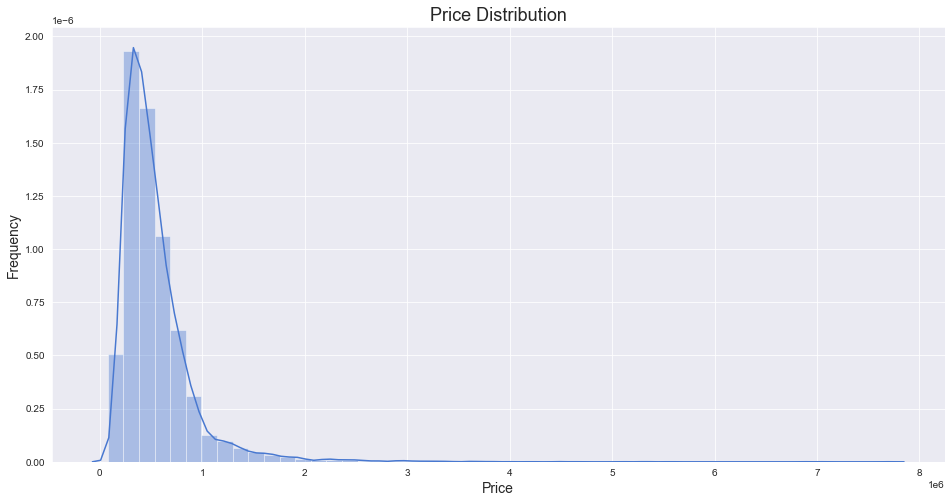

In [40]:
# Plotting the price distribution
fig, gr = plt.subplots()

# Figure Size
gr.figure.set_size_inches(16,8)

# Plotting distribution graph
gr = sns.distplot(df4['price'])
set_plots_features(gr, 'Price Distribution', 'Price', 'Frequency')

# Display the plotting
plt.show()

We can see from the distribution that the prices are not close to a normal distribution, because we have a Poisson distribution, in which it is a positive asymmetric distribution. This happens because the average price is higher than the median and its fashion.

There are techniques that transform this distribution into a normal one, but as this is not the focus of the work, we will not detail these methods, as no Machine Learning model will be applied.

### 4.1.2 Numerical Variables

For the numerical variables, we will plot their histograms for analysis and draw some conclusions.

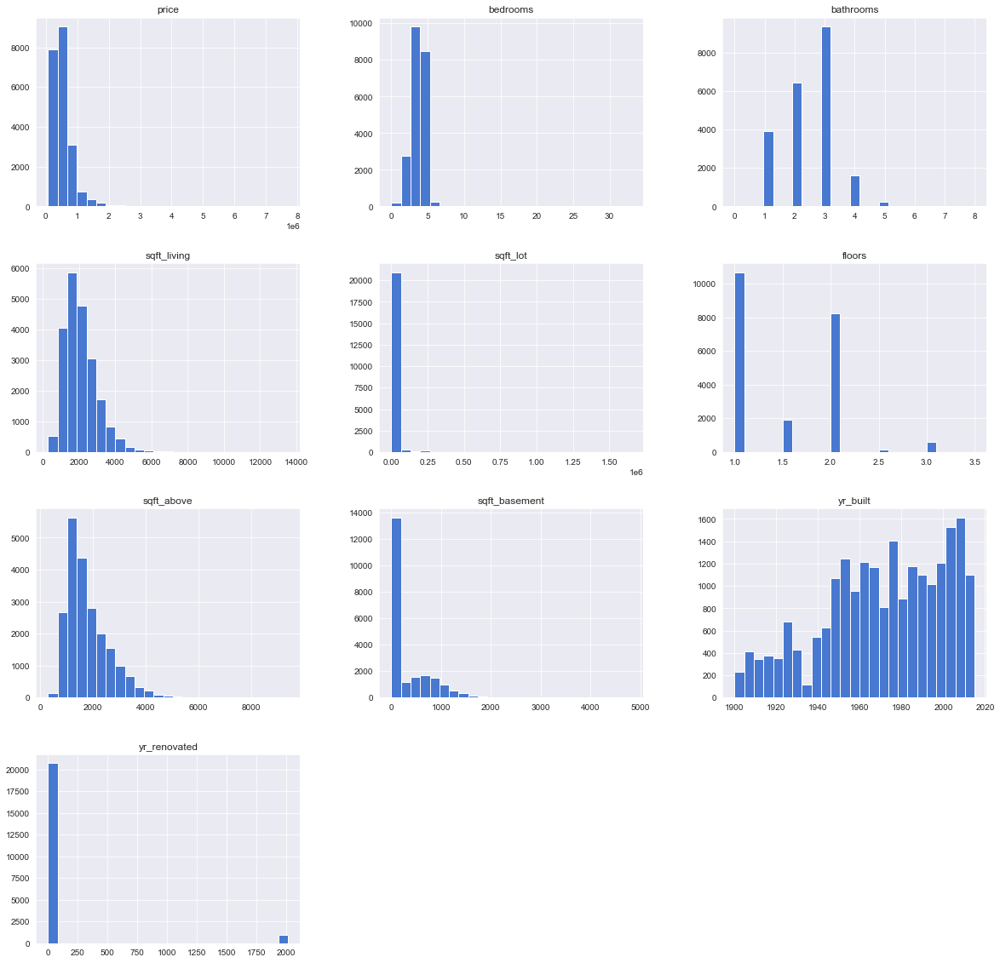

In [41]:
# Tamanho da figura
fig = plt.figure(figsize=(20,20))

# Conjunto de eixos
ax = fig.gca()

# Plotando histogramas
est.hist(ax=ax, bins=25)

# Exibição dos gráficos
plt.show()

Analysis of Histograms:

- **yr_built:** It is observed that as the years go by, the construction of houses has a significant post-war increase with some volatility between the decades of 1950 and 2000. However, from the years 2000 on, the construction of houses had an increasing increase and stabilized in 2015.


- **yr_renovated:** it can be observed that most houses were not renovated. And the houses that were renovated occurred in the late 20th and early 21st centuries.


- **sqft_above:** it is observed that the majority of the houses concentrate a metreage until 2000 m². This area does not count if the house has basement.


- **sqft_living:** It is observed that most of the houses have an area of up to 3000 m². In the case of this variable we have the sum of **area_casa** + **area_porao**.


- **sqft_basement:** It is observed that most of the houses do not have a basement.


- **sqft_lot:** Observing the graph and the data, it can be concluded that more than 20,000 houses have an area between 5,040 m² and 10,868 m².


- **bathrooms:** It can be stated that most of the houses have 3 bathrooms, followed by 2 and 1 bathrooms.


- **floors:** It can be observed that most of the houses have 1 and 2 levels.


- **price:** It can be observed in the graph that the prices of most houses cost below 1,000,000 dollars. This histogram confirms what was seen in the descriptive statistics of this feature.


- **bedrooms:** In the graph it can be seen that most houses have about 3 to 4 rooms. This may explain that the more rooms the house has, the more expensive it will be.

### 4.1.3 Categorical Variables

In [42]:
# Viewing categorical variables
cat_atr.head()

,waterfront,condition,grade
0,no,Média,7
1,no,Média,7
2,no,Média,6
3,no,Muito Bom,7
4,no,Média,8


In [43]:
# Checking the elements that the feature condition has
df4['condition'].unique()

array(['Média', 'Muito Bom', 'Bom', 'Pobre', 'Justo'], dtype=object)

In [44]:
# Checking the elements that the grade feature has
df4['grade'].unique()

array([7, 6, 8, 11, 9, 5, 10, 12, 4, 3, 13], dtype=object)

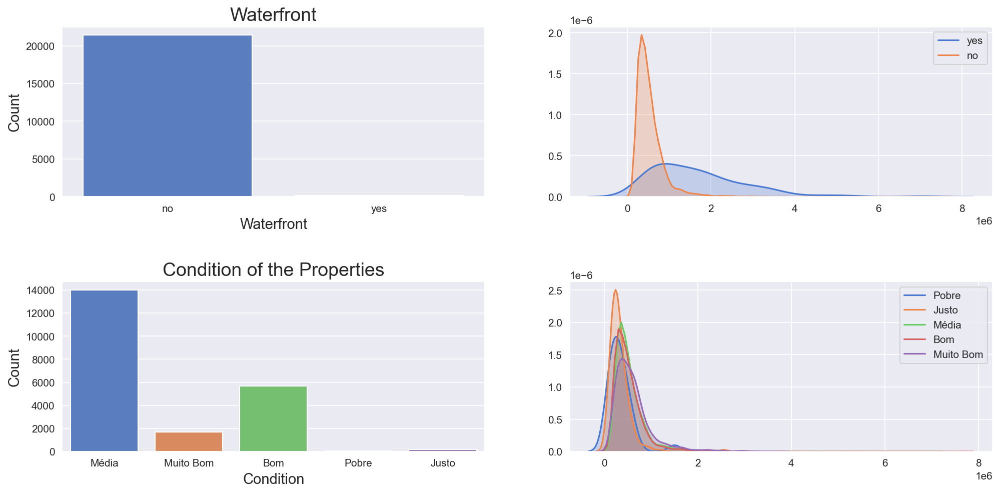

In [45]:
fig, gr = plt.subplots(dpi=150)

gr.figure.set_size_inches(16,12)


# Vista água
plt.subplot(3,2,1)
gr = sns.countplot(df4['waterfront'])
set_plots_features(gr, 'Waterfront', 'Waterfront', 'Count')

plt.subplot(3,2,2)
gr = sns.kdeplot(df4[df4['waterfront']== 'yes']['price'], label = 'yes', shade = True)
gr = sns.kdeplot(df4[df4['waterfront']== 'no']['price'], label = 'no', shade = True)

# Condicao
plt.subplot(3,2,3)
gr = sns.countplot(df4['condition'])
set_plots_features(gr, 'Condition of the Properties', 'Condition', 'Count')

plt.subplot(3,2,4)
gr = sns.kdeplot(df4[df4['condition'] == 'Pobre']['price'], label = 'Pobre', shade=True)
gr = sns.kdeplot(df4[df4['condition'] == 'Justo']['price'], label = 'Justo', shade=True)
gr = sns.kdeplot(df4[df4['condition'] == 'Média']['price'], label = 'Média', shade=True)
gr = sns.kdeplot(df4[df4['condition'] == 'Bom']['price'], label = 'Bom', shade=True)
gr = sns.kdeplot(df4[df4['condition'] == 'Muito Bom']['price'], label = 'Muito Bom', shade=True)

plt.subplots_adjust(hspace=0.5)

plt.show()

**Observations:**


* Most of the houses in the county do not have a view of the water, but relating the price, houses that have a view have a more uniform distribution of houses that have no view. This is due to the fact that houses with no view of water have many outliers.


* Most of the houses have medium and good conditions. And no distribution is close to a normal one.

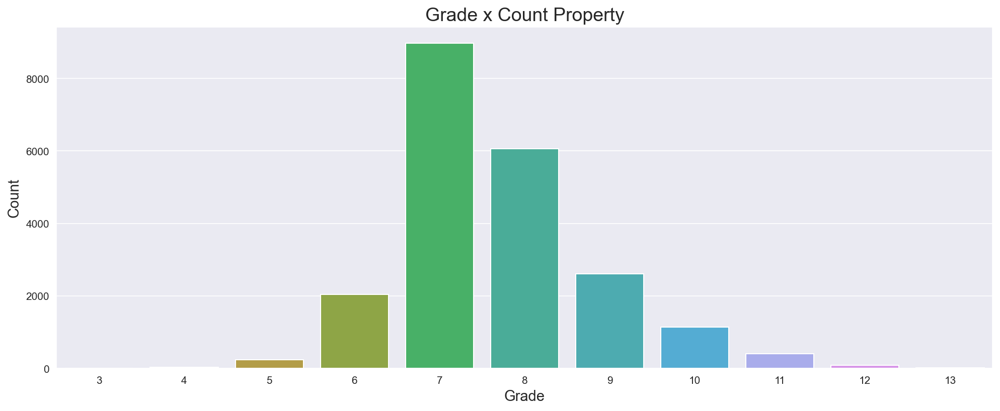

In [46]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,6)

# Plotting bar graphs
gr = sns.countplot(df4['grade'])
set_plots_features(gr, 'Grade x Count Property', 'Grade', 'Count')

# Display the plots
plt.show()

Looking at the graph above, we notice that most of the houses in King County have grades 7 and 8, that is, most of the houses have construction and average design in good condition. And there are also a few houses that have an average of less than 7 compared to the others. Therefore, we concluded that the county houses have a good quality of construction and design.

## 4.2 Bivariate Analysis

In the bivariate analysis, we will make the validation of the hypotheses that were created by region in section 2. Before we will separate the data by region to make the observations by sectors.

In [47]:
# Houses North Region
north = df4[df4['region']=='North/Seattle']

# Houses Mountain Region
montains = df4[df4['region']=='Montains']

# Houses South Region
south = df4[df4['region'] =='South']

### H1. Old houses should be less valued.

#### North/Seattle Region
**FALSE:** Old houses are not less valued.

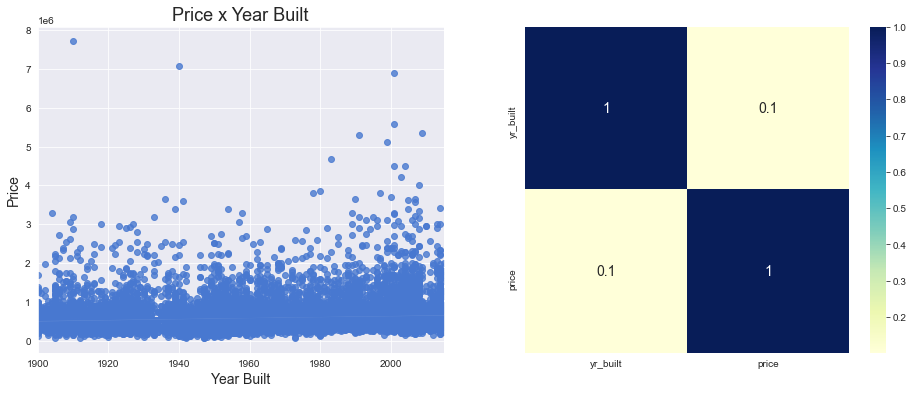

In [48]:
# Selecting columns 
north_year = north[['yr_built', 'price']]

fig, gr = plt.subplots()

# Figure Size
gr.figure.set_size_inches(16,6)

# Plotting a regression line
plt.subplot(1, 2, 1)
gr = sns.regplot(x='yr_built', y = 'price', data=north_year)
set_plots_features(gr,'Price x Year Built', 'Year Built', 'Price')

# Plotting heat map
plt.subplot(1, 2, 2)
gr = sns.heatmap(north_year.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap="YlGnBu")

# Exibição do gráfico
plt.show()

In the North region, we observe by the dispersion graph that the points do not have a tendency, so much so that there are old houses much more expensive than houses that were recently built. This is confirmed by the correlation matrix whose coefficient is 0.10, being considered a negligible positive value, where there is little relation between the year of construction and the price of houses.

> Therefore, for the North Region the hypothesis is **FALSE**.

#### Montains Region
**TRUE:** Old houses are less valued.

In [49]:
# Selecting variables
montains_year = montains[['yr_built', 'price']]

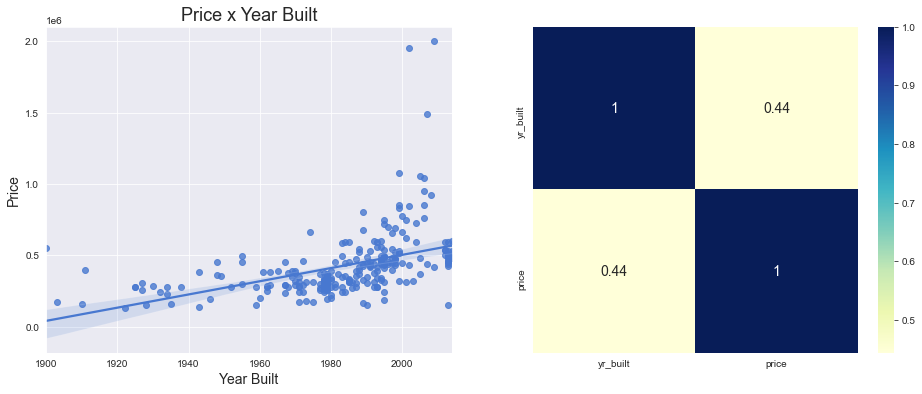

In [50]:
fig, gr = plt.subplots()

# Tamanho da figura
gr.figure.set_size_inches(16,6)

# Plotando uma reta de Regressão
plt.subplot(1, 2, 1)
gr = sns.regplot(x='yr_built', y = 'price', data=montains_year)
set_plots_features(gr,'Price x Year Built', 'Year Built', 'Price' )

# Plotando mapa de calor
plt.subplot(1, 2, 2)
gr = sns.heatmap(montains_year.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap="YlGnBu")

# Exibição do gráfico
plt.show()

In the Mountains region, we observe by the dispersion graph that the points follow an increasing trend with respect to the regression line. And in the correlation matrix we see the coefficient value of 0.44, which is a moderate positive value, that is, the more recent the construction of the houses, the more valued they are.

> Therefore, for the Mountain Region the hypothesis is **TRUE**.

#### South Region
**FALSE:** Old houses are no less valued.

In [51]:
# Selecting variables
south_year = south[['yr_built', 'price']]

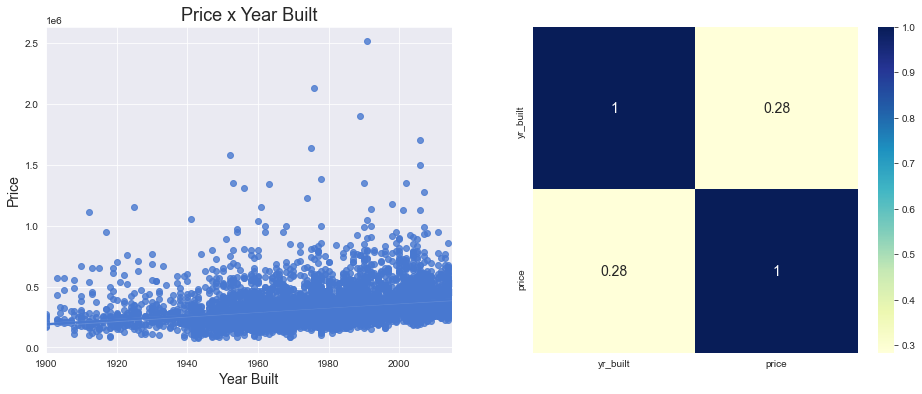

In [52]:
fig, gr = plt.subplots()

# Figure Size
gr.figure.set_size_inches(16,6)

# Plotting a regression line
plt.subplot(1, 2, 1)
gr = sns.regplot(x='yr_built', y = 'price', data=south_year)
set_plots_features(gr,'Price x Year Built', 'Year Built', 'Price' )

# Plotting heatmap
plt.subplot(1, 2, 2)
gr = sns.heatmap(south_year.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap="YlGnBu")

# Display the plot
plt.show()

In the South region, we observe from the dispersion chart that the dots do not have so much of a growing tendency, so much so that there are old houses much more expensive than houses that were recently built. This is confirmed by the correlation matrix whose coefficient is 0.28, being considered a negligible positive value, that is, there is very little relationship between the year of construction and the price of houses.

> Therefore, for the Southern Region the hypothesis is **FALSE**.

### H2. Houses with a larger area should be more valued.

#### North/Seattle Region
**TRUE:** Houses with larger area are more valued.

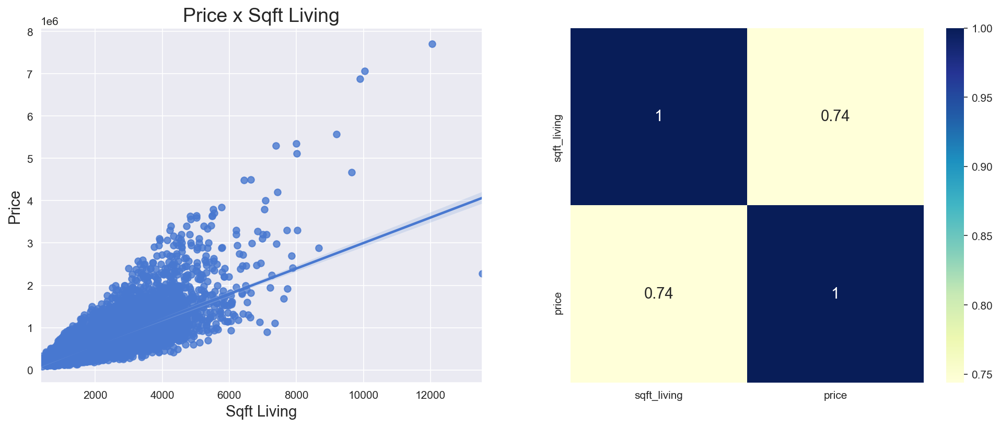

In [53]:
# Selecting Variables
north_area = north[['sqft_living', 'price']]

fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,6)

# Plotting a regression line
plt.subplot(1, 2, 1)
gr = sns.regplot(x='sqft_living', y = 'price', data=north_area)
set_plots_features(gr, 'Price x Sqft Living', 'Sqft Living', 'Price' )

# Plotting Heatmap
plt.subplot(1, 2, 2)
gr = sns.heatmap(north_area.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap = "YlGnBu")

# Display the plot
plt.show()

In the North region, by the graphs, we observe a strong positive correlation, 0.74, between the price and the area of the houses. Therefore, I conclude that the larger the area of the houses, the higher are the prices. Therefore, for the North Region the hypothesis is **TRUE**.

#### Montains Region
**TRUE:** Houses with larger area are more valued.

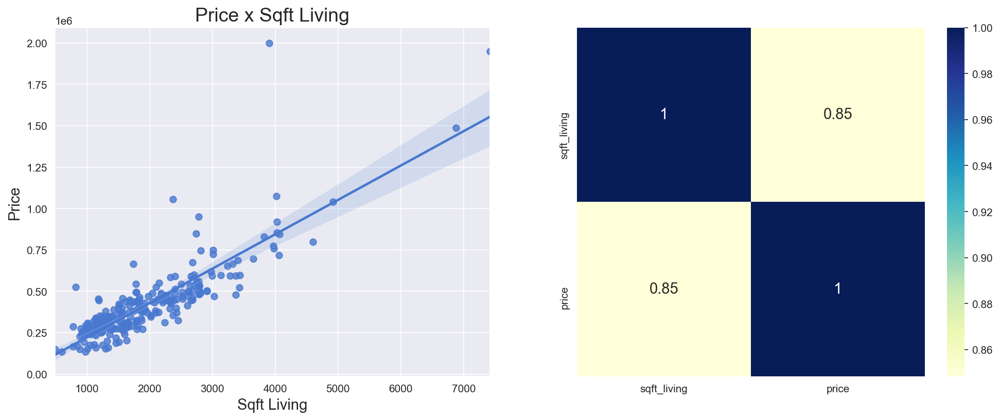

In [54]:
# Selecting Variables
montains_area = montains[['sqft_living', 'price']]

fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,6)

# Plotting a regression line
plt.subplot(1, 2, 1)
gr = sns.regplot(x='sqft_living', y = 'price', data=montains_area)
set_plots_features(gr, 'Price x Sqft Living', 'Sqft Living', 'Price' )

# Plotting heat map
plt.subplot(1, 2, 2)
gr = sns.heatmap(montains_area.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap = "YlGnBu")

# Display the plot
plt.show()

In the region of the Mountains, by the graphs, we observe a strong positive correlation, 0.85, between the price and the area of the houses. Therefore, I conclude that the larger the area of the houses, the higher are the prices. Therefore, for the Mountains Region the hypothesis is **TRUE**.

#### South Region
**TRUE:** Houses with larger area are more valued.

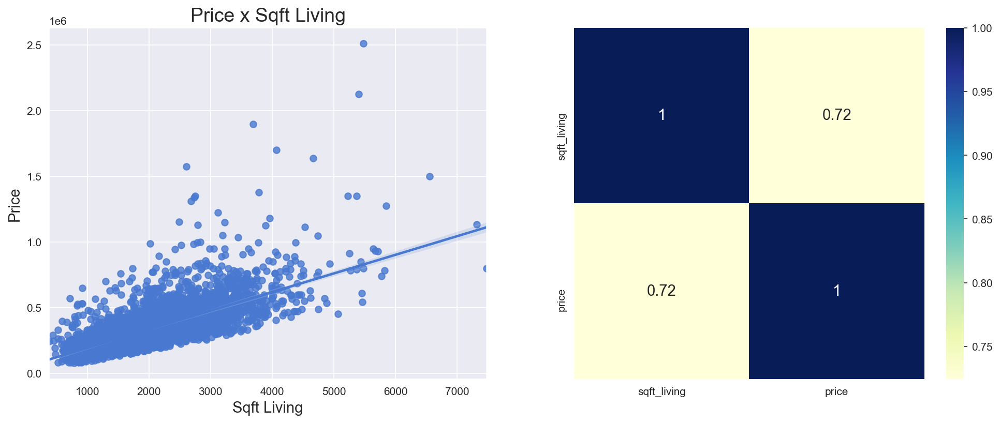

In [55]:
# Selecting Variables
south_area = south[['sqft_living', 'price']]

fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,6)

# Plotting a regression line
plt.subplot(1, 2, 1)
gr = sns.regplot(x='sqft_living', y = 'price', data=south_area)
set_plots_features(gr, 'Price x Sqft Living', 'Sqft Living', 'Price' )

# Plotting heatmap
plt.subplot(1, 2, 2)
gr = sns.heatmap(south_area.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap = "YlGnBu")

# Display the plot
plt.show()

In the South region, by the graphs, we observe a strong positive correlation, 0.72, between the price and the area of the houses. Therefore, we also concluded that the larger the area of the houses, the higher are the prices. Therefore, for the South Region the hypothesis is **TRUE**.

### H3. Houses with more bedrooms should be more valued.

#### North/Seattle Region
**FALSE:** Houses with more bedrooms are no longer valued.

In [56]:
# Selecting and grouping by variables
north_bedroom_price = north[['bedrooms', 'price']].groupby('bedrooms').mean().reset_index()
north_bedroom_price

,bedrooms,price
0,1,3.409467e+05
1,2,4.379249e+05
2,3,5.502847e+05
3,4,7.552220e+05
4,5,9.047163e+05
5,6,9.371696e+05
6,7,1.009546e+06
7,8,1.233000e+06
8,9,8.939998e+05
9,10,8.193333e+05


In [57]:
# Number of houses per number of rooms
north['bedrooms'].value_counts()

3     6407
4     4718
2     2193
5     1220
6      215
1      147
7       33
8       11
9        6
10       3
11       1
Name: bedrooms, dtype: int64

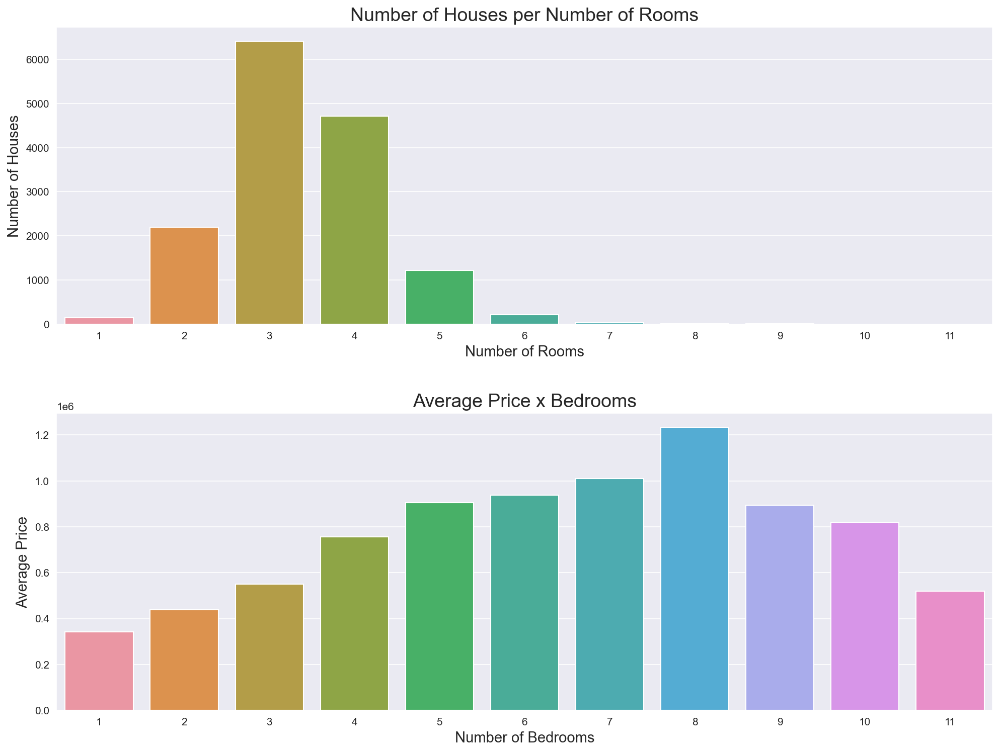

In [58]:
fig, gr = plt.subplots(dpi = 150)

# Figure Size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(north['bedrooms'])

# Title and labels
set_plots_features(gr, 'Number of Houses per Number of Rooms', 'Number of Rooms',
                   'Number of Houses')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x = 'bedrooms', y = 'price', data= north_bedroom_price)

# Title and labels
set_plots_features(gr, 'Average Price x Bedrooms', 'Number of Bedrooms', 'Average Price')
plt.subplots_adjust(hspace=0.3)

# Display the plot
plt.show()

In the North Region, we verified by the first graph that there are more houses with 3 and 4 bedrooms. Already in the second graph analyzing the average price in relation to the number of rooms, we can affirm that houses with more rooms are cheaper than houses with less rooms, because there are houses with 9, 10 and 11 rooms that are cheaper. This can occur because of the bad conditions that both houses find each other.

> Therefore, the hypothesis for the North/Seattle Region is **FALSE**.

#### Montains Region
**TRUE:** Houses with more bedrooms are more valued.

In [59]:
# Selecting and grouping variables
montains_bedrooms_price = montains[['bedrooms', 'price']].groupby('bedrooms').mean().reset_index()
montains_bedrooms_price

,bedrooms,price
0,1,295137.500000
1,2,354216.346154
2,3,384145.688312
3,4,550197.948276
4,5,625055.250000


In [60]:
#Number of houses by number of rooms
montains['bedrooms'].value_counts()

3    154
4     58
2     26
5      8
1      4
Name: bedrooms, dtype: int64

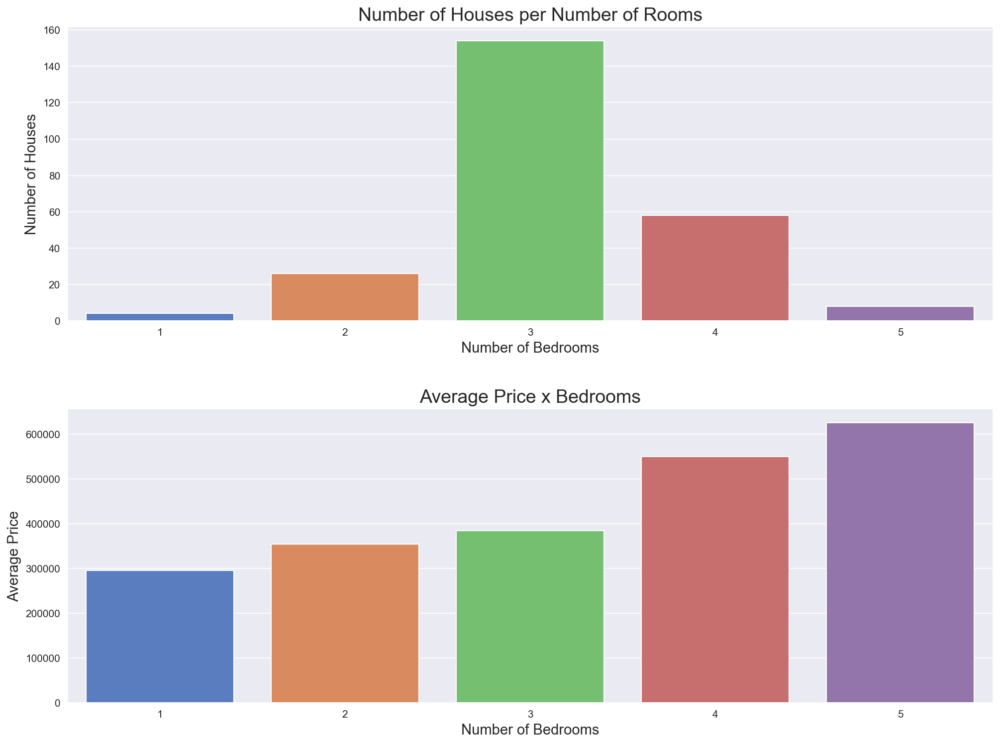

In [61]:
fig, gr = plt.subplots(dpi = 150)

# Figure Size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(montains['bedrooms'])

# Tiitle and labels
set_plots_features(gr, 'Number of Houses per Number of Rooms', 'Number of Bedrooms',
                   'Number of Houses')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x = 'bedrooms', y = 'price', data = montains_bedrooms_price)

# Title and labels
set_plots_features(gr, 'Average Price x Bedrooms', 'Number of Bedrooms', 'Average Price')
plt.subplots_adjust(hspace=0.3)

# Display the plot
plt.show()

In the Mountains Region, we verified in the first graph that there are more houses with 3 and 4 bedrooms. On the second graph, we concluded that the more rooms the houses have, the more they are valued, because the average price is increasing.

> In this case, the hypothesis for the Mountains Region is **TRUE**.

#### South Region
**FALSE:** Houses with more bedrooms are no longer valued.

In [62]:
# Selecting and grouping variables
south_bedrooms_price = south[['bedrooms', 'price']].groupby('bedrooms').mean().reset_index()

In [63]:
# Number of houses per number of rooms
south['bedrooms'].value_counts()

3    3264
4    2106
2     541
5     373
6      57
1      45
7       5
8       2
Name: bedrooms, dtype: int64

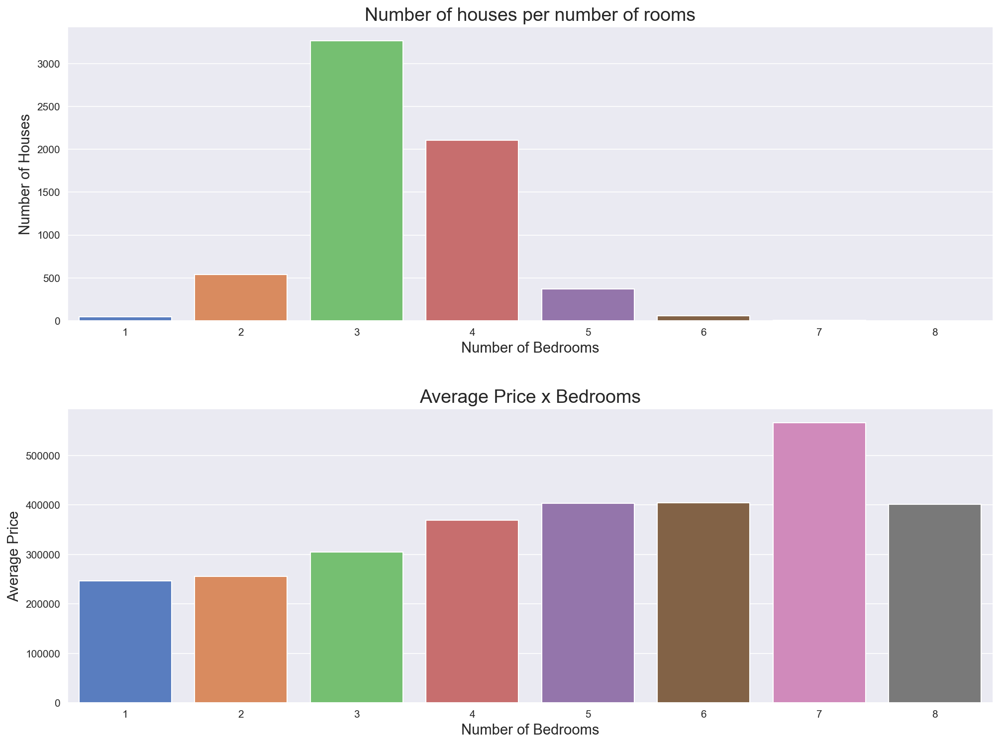

In [64]:
fig, gr = plt.subplots(dpi=150)

# Figure size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(south['bedrooms'])
# Titulo e rotulos nos eixos
set_plots_features(gr, 'Number of houses per number of rooms', 'Number of Bedrooms',
                   'Number of Houses')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x = 'bedrooms', y = 'price', data= south_bedrooms_price)

# Title and labels
set_plots_features(gr, 'Average Price x Bedrooms', 'Number of Bedrooms', 'Average Price')

plt.subplots_adjust(hspace=0.3)

# Display the plot
plt.show()

In the South region, we verified by the first graph that has more houses with 3 and 4 rooms. On the second graph we concluded that the average price of houses in relation to the number of rooms does not vary increasingly, that is, houses with more numbers of rooms have almost the same average price of houses with fewer rooms. And also houses with 7 rooms are more expensive than houses with 8 rooms.

> Therefore, the hypothesis for the South Region is **FALSE**.

### H4. Houses with more bathrooms should be more valued.

####  North/Seattle Region
**TRUE:** Houses with more bathroom numbers are more valued.

In [65]:
# Selecting and grouping variables
north_bathrooms_price = north[['bathrooms', 'price']].groupby('bathrooms').mean().reset_index()
north_bathrooms_price = round(north_bathrooms_price, 2)
north_bathrooms_price

,bathrooms,price
0,1,399460.21
1,2,519183.61
2,3,673200.02
3,4,1055568.14
4,5,1623666.09
5,6,2440310.00
6,7,2854978.00
7,8,4328750.00


In [66]:
# Number of houses per number of bathrooms
north['bathrooms'].value_counts()

3    6267
2    4334
1    2710
4    1410
5     194
6      30
7       5
8       4
Name: bathrooms, dtype: int64

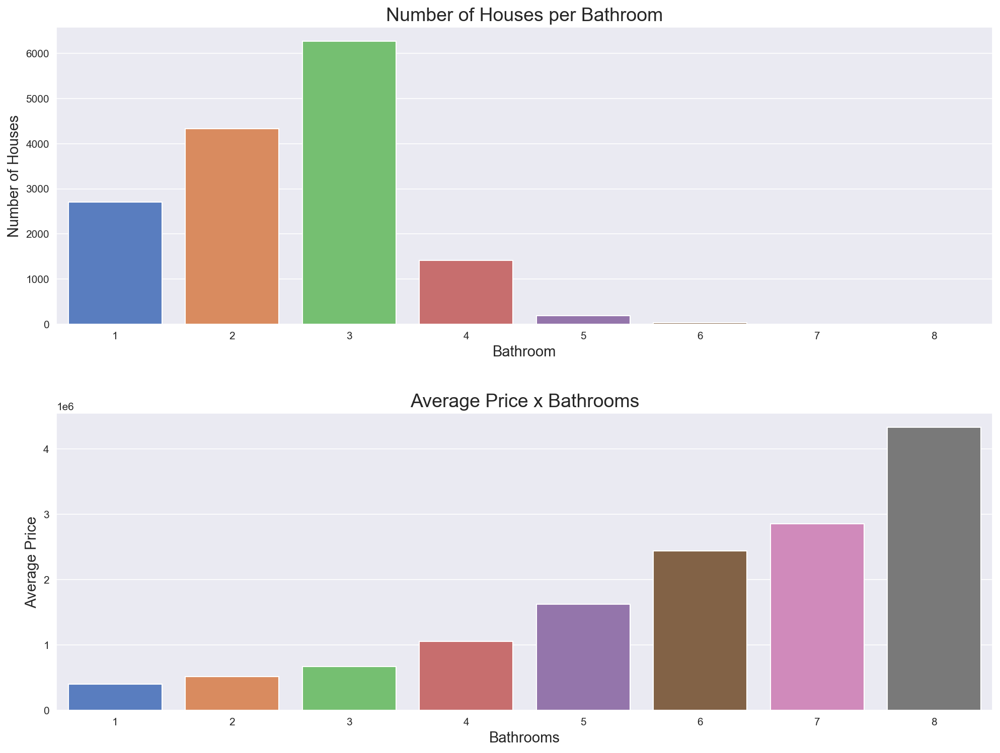

In [67]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(north['bathrooms'])

# Title and labels
set_plots_features(gr, 'Number of Houses per Bathroom', 'Bathroom','Number of Houses')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x ='bathrooms', y ='price', data=north_bathrooms_price)


# Title and labels
set_plots_features(gr, 'Average Price x Bathrooms', 'Bathrooms', 'Average Price')
plt.subplots_adjust(hspace=0.3)

# Display the plot
plt.show()

In the North Region/Seattle, in the first graph, we verified that there are more houses with 2 and 3 bathrooms. In the second graphic, we conclude by observing that as the number of bathrooms in the houses increases, the more the houses are valued. Therefore, the hypothesis valid for the North/Seattle Region is **TRUE**.

#### Montains Region
**TRUE:** Houses with more bathroom numbers are more valued.

In [68]:
# Selecting and grouping variables
montains_bathrooms_price = montains[['bathrooms', 'price']].groupby('bathrooms').mean().reset_index()
montains_bathrooms_price

,bathrooms,price
0,1,2.662951e+05
1,2,3.511593e+05
2,3,5.029348e+05
3,4,8.321942e+05
4,5,1.042000e+06
5,6,1.488000e+06


In [69]:
# Number of houses per bathroom number
montains['bathrooms'].value_counts()

3    105
2     87
1     46
4     10
6      1
5      1
Name: bathrooms, dtype: int64

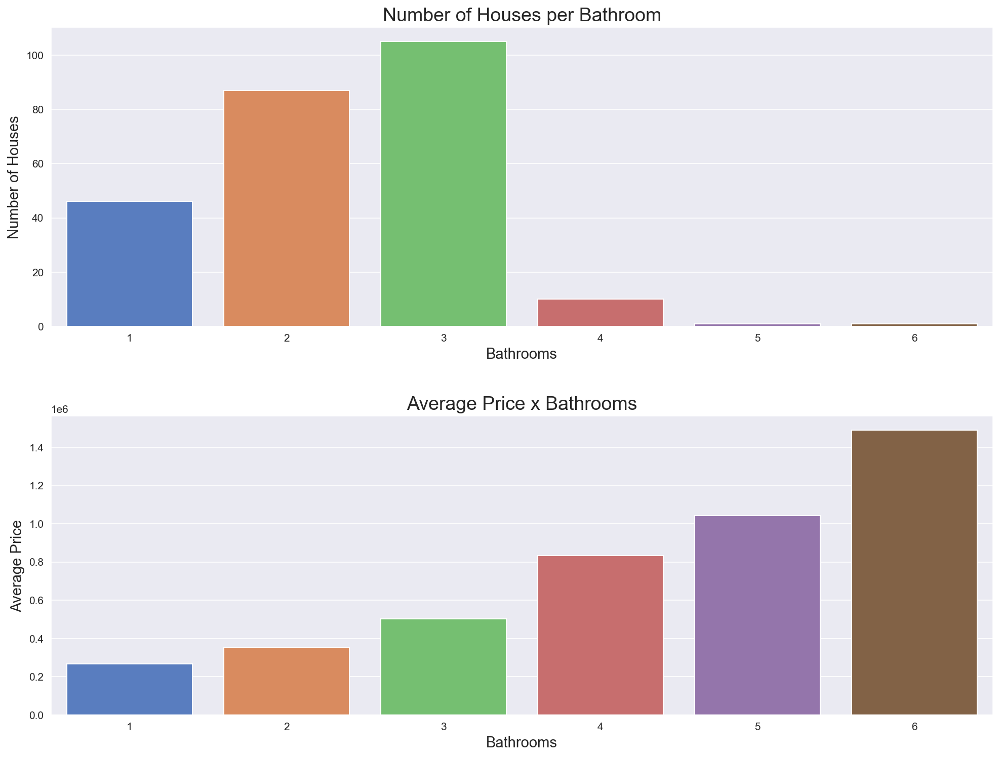

In [70]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(montains['bathrooms'])

# Title and labels
set_plots_features(gr, 'Number of Houses per Bathroom', 'Bathrooms',
                   'Number of Houses')


# Plotting 
plt.subplot(2,1,2)
gr = sns.barplot(x = 'bathrooms', y = 'price', data= montains_bathrooms_price)

# Title and labels
set_plots_features(gr, 'Average Price x Bathrooms', 'Bathrooms', 'Average Price')

plt.subplots_adjust(hspace=0.3)

# Display the plots
plt.show()

In the Mountains Region, by observing in the first graph that there are more houses with 3 bathrooms. And already in the second graph, we conclude that the more bathrooms the houses have, the more they are valued. Therefore, for the Mountain Region the hypothesis is **TRUE**.

#### South Region
**FALSE:** Houses with more bathroom numbers are no longer valued.

In [71]:
# Selecting and grouping variables
south_bathrooms_price = south[['bathrooms', 'price']].groupby('bathrooms').mean().reset_index()

In [72]:
# Number of houses per number of bathrooms
south['bathrooms'].value_counts()

3    2990
2    2011
1    1170
4     191
5      28
6       2
7       1
Name: bathrooms, dtype: int64

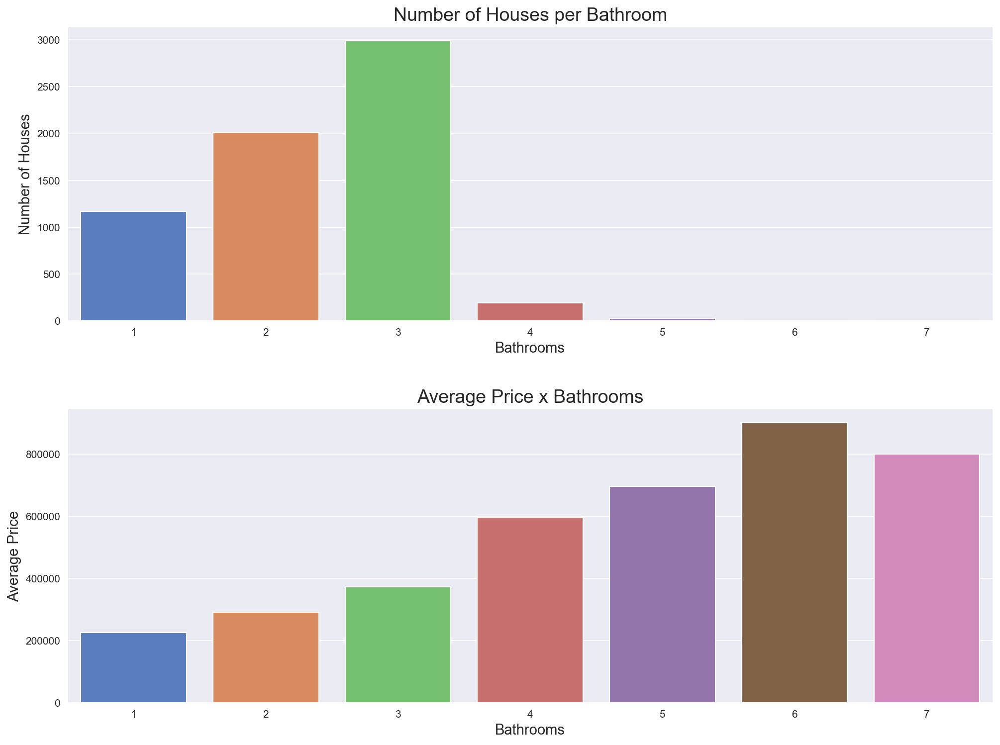

In [73]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(south['bathrooms'])

# Title and labels
set_plots_features(gr, 'Number of Houses per Bathroom', 'Bathrooms',
                   'Number of Houses')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x = 'bathrooms', y = 'price', data= south_bathrooms_price)

# Title and labels
set_plots_features(gr, 'Average Price x Bathrooms', 'Bathrooms', 'Average Price')
plt.subplots_adjust(hspace=0.3)

# Display the plot
plt.show()

In the South Region, we verified by the first graph that there are more houses with 2 and 3 bathrooms. In the second graphic we conclude by the observation that the more bathrooms the houses have, but valued are. However, the average price of houses with 6 bathrooms are more valued than the average price of houses with 7 bathrooms. Therefore, the hypothesis in the Southern Region is **FALSE**.

### H5. Renovated houses should be valued more.
**FALSE:** Renovated houses are no more valued.

In [74]:
# Selecting and grouping variables
house_reform = df4[['reform_house','region', 'price']].groupby(['reform_house','region']).mean().reset_index()
house_reform = round(house_reform,2)
house_reform 

,reform_house,region,price
0,no,Montains,429851.61
1,no,North/Seattle,620985.78
2,no,South,326453.97
3,yes,Montains,338727.27
4,yes,North/Seattle,865069.69
5,yes,South,396853.57


In [75]:
aux1 = df4[['reform_house', 'region']]

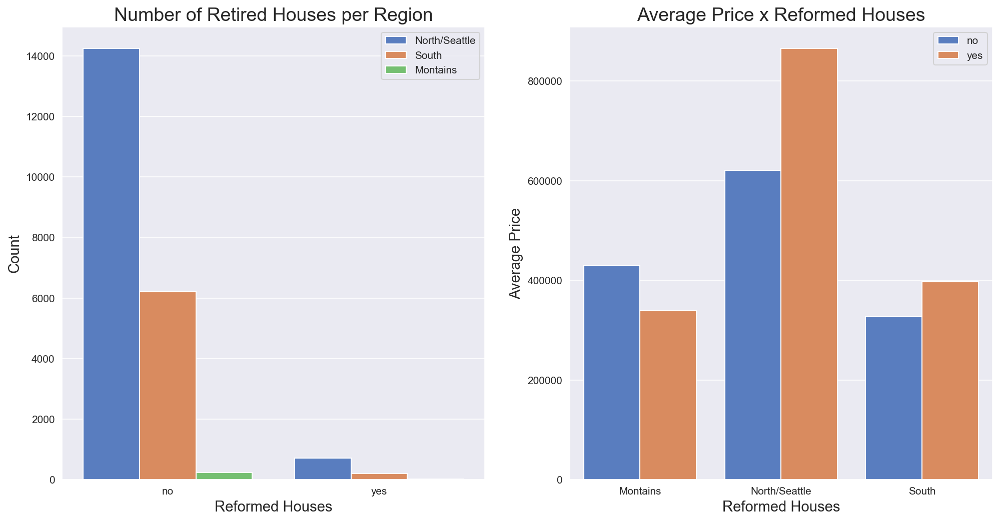

In [76]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,8)

# Plotting count graph
plt.subplot(1,2,1)
gr = sns.countplot(x = 'reform_house', hue='region', data=aux1)
set_plots_features(gr, 'Number of Retired Houses per Region', 'Reformed Houses', 'Count')
plt.legend()

# Plotting bar graph
plt.subplot(1,2,2)
gr = sns.barplot(x = 'region', hue= 'reform_house', y = 'price', data = house_reform)
set_plots_features(gr,'Average Price x Reformed Houses', 'Reformed Houses', 'Average Price')
plt.legend()

# Display the plots
plt.show()

In the Mountains Region, we observe that the average price of non-refurbished houses is much more valued than the average price of renovated houses. And the number of unrefurbished houses is higher. This should be contradictory, because generally the price of renovated houses is more valued. Therefore, the hypothesis for the Mountain Region is **FALSE**.

In the North Region, on the other hand, we notice that retired houses are more valued than non-refurbished houses, although the number of non-refurbished houses is greater. Therefore, the hypothesis for the North Region is **TRUE**.

And finally, in the South Region, we see that retired houses are much more valued than non-refurbished houses, although the number of non-refurbished houses is greater. Therefore, the hypothesis for the South Region is **TRUE**.

> However, the general hypothesis for the entire King County is **FALSE**.

### H6. Houses with basements should be valued more.
**TRUE:** Houses with basements are more valued.

In [77]:
# Selecting and grouping variables
house_base = df4[['house_basement', 'region', 'price']].groupby(['house_basement', 'region']).mean().reset_index()
house_base = round(house_base, 2)
house_base

,house_basement,region,price
0,no,Montains,422035.98
1,no,North/Seattle,582298.17
2,no,South,319737.94
3,yes,Montains,444691.67
4,yes,North/Seattle,694834.18
5,yes,South,351776.73


In [78]:
aux2 = df4[['house_basement', 'region']]

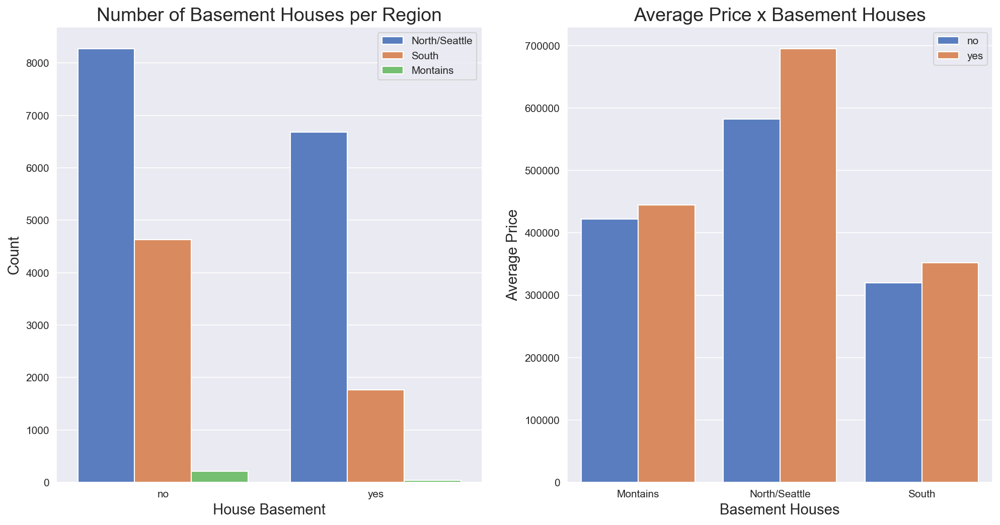

In [79]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,8)

# Plotting count graph
plt.subplot(1,2,1)
gr = sns.countplot(x = 'house_basement', hue='region', data=aux2)
set_plots_features(gr, 'Number of Basement Houses per Region', 'House Basement', 'Count')
plt.legend()

# Plotting bar graph
plt.subplot(1, 2, 2)
gr = sns.barplot(x = 'region', hue= 'house_basement', y = 'price', data = house_base)
set_plots_features(gr,'Average Price x Basement Houses', 'Basement Houses', 'Average Price')
plt.legend()
# Exibição do gráfico
plt.show()

In the Mountain Regions, North/Seattle and South we notice that the number of houses with basements is smaller than houses without basements. However, the average prices of houses with basements are more valued. Therefore, the hypothesis is **TRUE**.

### H7. Houses with more conditions should be more valued.

#### North/Seattle Region
**FALSE:** Houses with more conditions are not valued.

In [80]:
# Selecting and grouping variables
aux = north[['condition', 'price']].groupby('condition').mean().reset_index()
aux

,condition,price
0,Bom,635980.916120
1,Justo,383963.430000
2,Muito Bom,710000.206089
3,Média,624363.738146
4,Pobre,390293.181818


In [81]:
# Number of houses per condition
north['condition'].value_counts()

Média        9891
Bom          3660
Muito Bom    1281
Justo         100
Pobre          22
Name: condition, dtype: int64

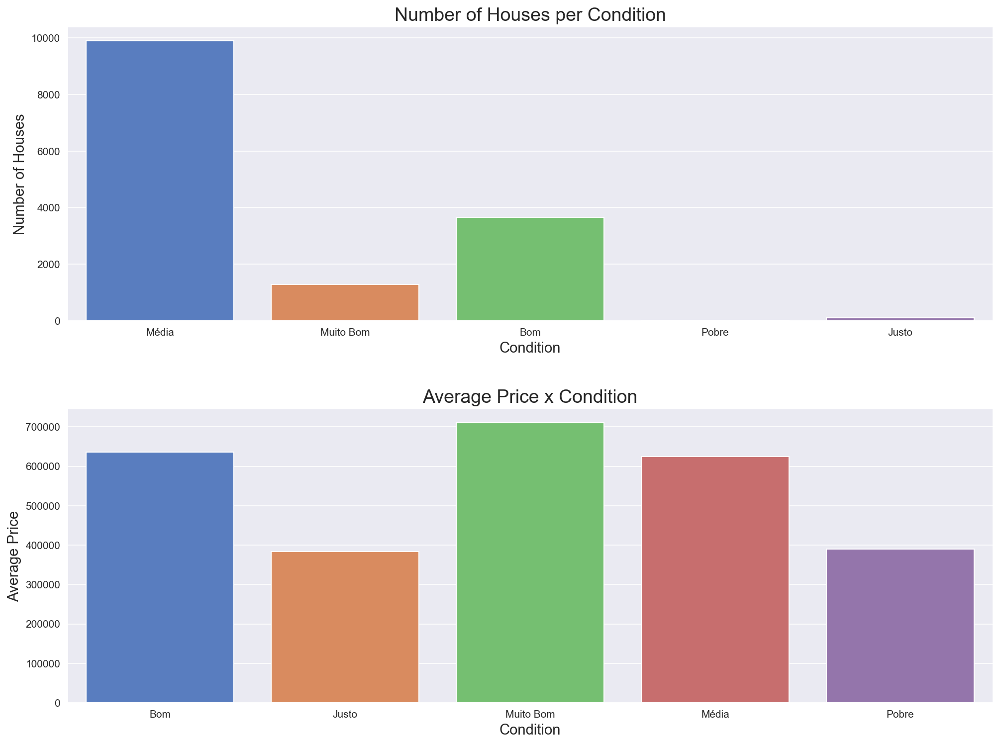

In [82]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(north['condition'])

# Title and labels
set_plots_features(gr, 'Number of Houses per Condition', 'Condition',
                   'Number of Houses')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x = 'condition', y = 'price', data=aux)

# Title and labels
set_plots_features(gr, 'Average Price x Condition', 'Condition', 'Average Price')
plt.subplots_adjust(hspace=0.3)

# Display the plot
plt.show()

Looking at the first graph, the North/Seattle region has more houses in the average condition, that is, they are considered houses of average pattern. And by the second graphic, we affirm that houses of superior condition are not more valued than houses of inferior conditions, because the average price between houses of poor and fair conditions are equal. And the same situation happens with houses of medium and good conditions.

> Therefore, the hypothesis for the North/Seattle region is **FALSE**.

#### Montains Region
**FALSE:** Houses with more conditions are not valued.

In [83]:
# Number of houses per condition
montains['condition'].value_counts()

Média        203
Bom           39
Justo          4
Muito Bom      4
Name: condition, dtype: int64

In [84]:
# Selecting and grouping by variables
aux1 = montains[['condition', 'price']].groupby('condition').mean().reset_index()
aux1

,condition,price
0,Bom,309135.897436
1,Justo,267750.000000
2,Muito Bom,306750.000000
3,Média,453725.290640


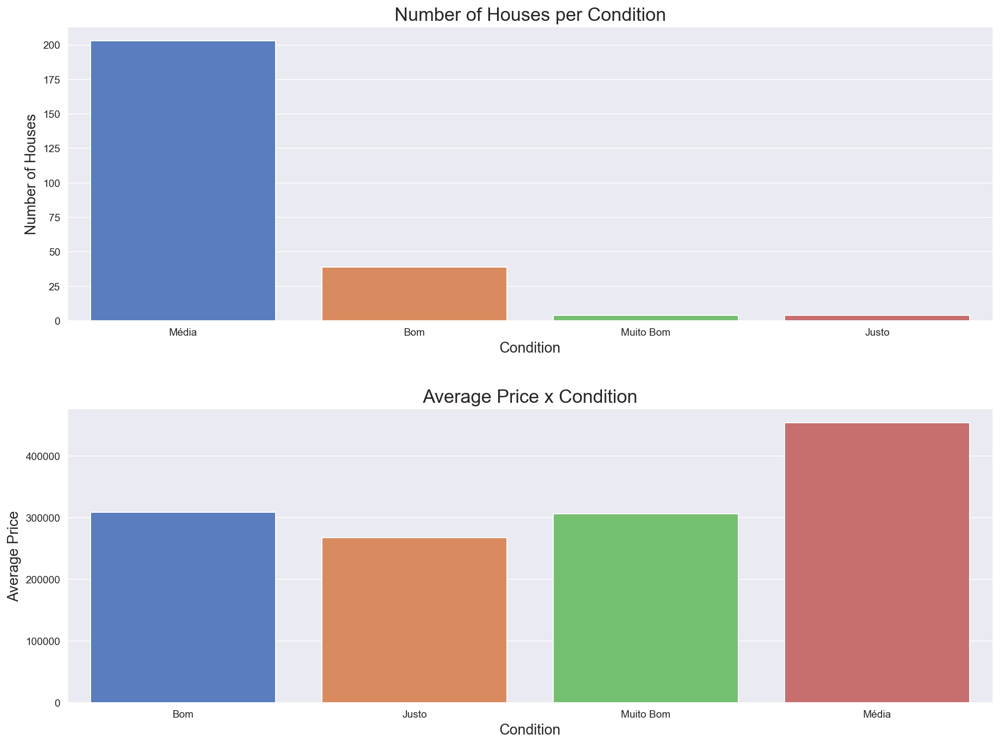

In [85]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(montains['condition'])

# Title and Labels
set_plots_features(gr, 'Number of Houses per Condition', 'Condition',
                   'Number of Houses')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x = 'condition', y = 'price', data=aux1)

# Title and labels
set_plots_features(gr, 'Average Price x Condition', 'Condition', 'Average Price')
plt.subplots_adjust(hspace=0.3)

# Display the plots
plt.show()

Looking at the first graph, the region of the mountains has more houses of medium condition, that is, they are considered houses of medium pattern. And by the second graph, we conclude that the houses of Medium condition are more valued than the houses of Good and Very Good condition, conditions of higher standards. Therefore, the hypothesis for the mountain region is **FALSE**.

#### South Region
**FALSE:** Houses with more conditions are not valued.

In [86]:
# Number of houses per condition
south['condition'].value_counts()

Média        3926
Bom          1978
Muito Bom     416
Justo          66
Pobre           7
Name: condition, dtype: int64

In [87]:
# Selecting and grouping by variables
aux2 = south[['condition', 'price']].groupby('condition').mean().reset_index()
aux2

,condition,price
0,Bom,313208.600607
1,Justo,247243.121212
2,Muito Bom,314869.966346
3,Média,339378.990321
4,Pobre,186357.142857


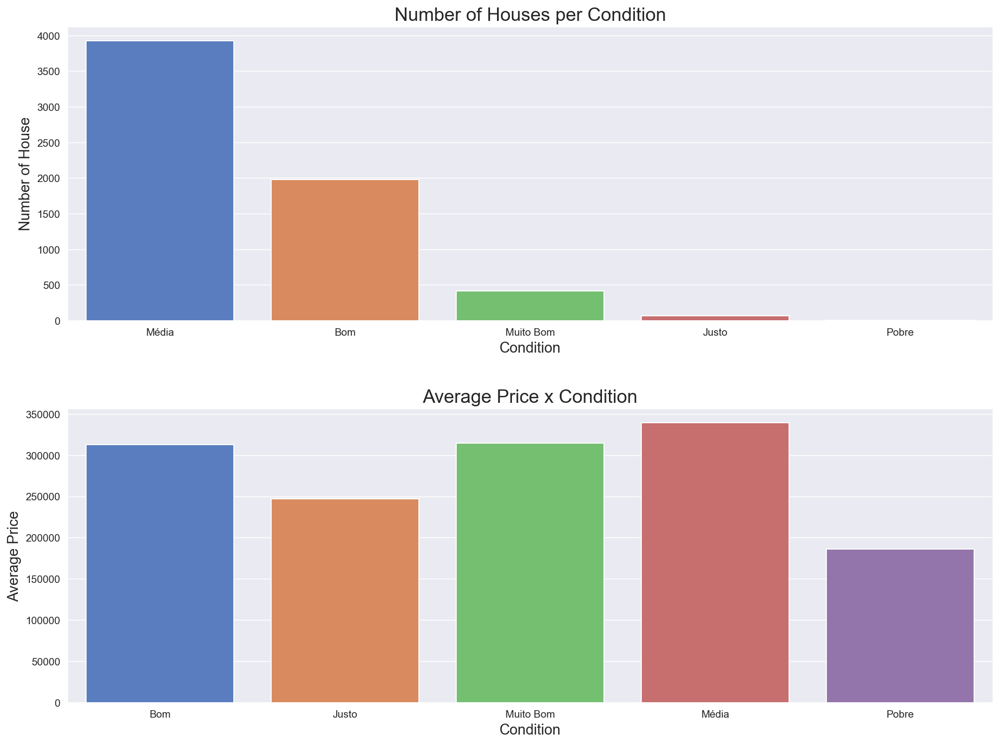

In [88]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(south['condition'])

# Title and labels
set_plots_features(gr, 'Number of Houses per Condition', 'Condition',
                   'Number of House')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x = 'condition', y = 'price', data=aux2)

# Title and labels
set_plots_features(gr, 'Average Price x Condition', 'Condition', 'Average Price')
plt.subplots_adjust(hspace=0.3)

# Display the plot
plt.show()

Looking at the first graph, the southern region has most of the houses of medium condition, that is, they are houses of medium pattern. And by the second graph, we conclude that the condition houses 3 are more valued than the Good and Very Good condition houses. Therefore, the hypothesis for the southern region is **FALSE**.

### H8. Houses with higher grades should be valued more.

#### North/Seattle Region
**TRUE:** Houses with higher grades are more valued.

In [89]:
# Number of houses per note
north['grade'].value_counts()

7     5766
8     4325
9     2050
6     1239
10     985
11     374
5      107
12      82
13      13
4       13
Name: grade, dtype: int64

In [90]:
# Selecting and grouping by variables
north_grade = north[['price','grade']].groupby('grade').mean().reset_index()

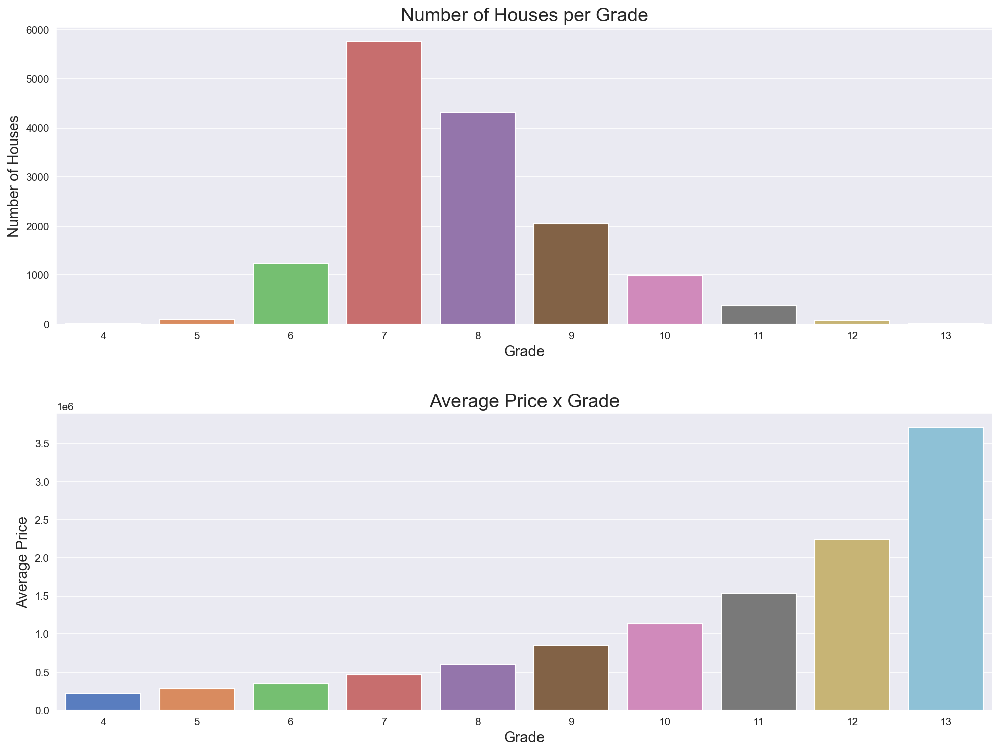

In [91]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(north['grade'])

# Title and labels
set_plots_features(gr, 'Number of Houses per Grade', 'Grade',
                   'Number of Houses')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x = 'grade', y = 'price', data= north_grade)

# Title and labels
set_plots_features(gr, 'Average Price x Grade', 'Grade', 'Average Price')
plt.subplots_adjust(hspace=0.3)
# Display the plot
plt.show()

In the North/Seattle region, we observe by the graph that most of the houses have a grade of 7, that is, their constructions are considered average. On the other hand, we conclude that the higher the grade of the houses, the more they are valued. Therefore, for the North/Seattle region the hypothesis is **TRUE**.

#### Montains Region
**TRUE:**  Houses with higher grades are more valued.

In [92]:
# Number of houses per note
montains['grade'].value_counts()

7     114
8      61
9      31
6      19
5      12
10      9
12      3
11      1
Name: grade, dtype: int64

In [93]:
# Selecting and grouping by variables
montains_grade = montains[['price','grade']].groupby('grade').mean().reset_index()

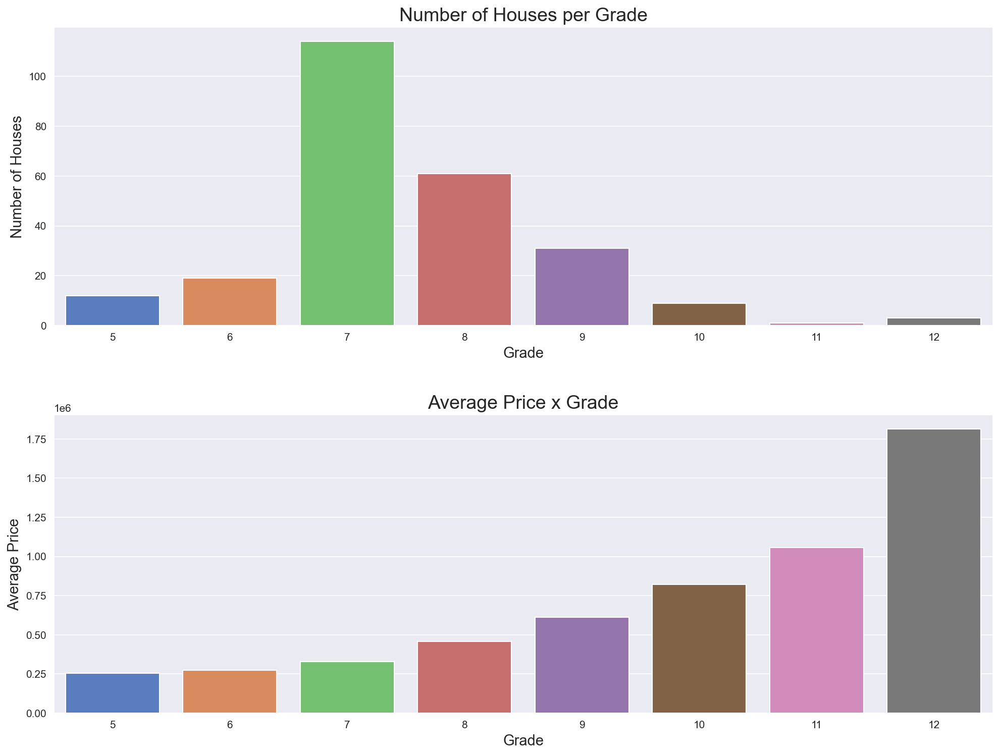

In [94]:
fig, gr = plt.subplots(dpi=150)

# Figure size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(montains['grade'])

# Title and labels
set_plots_features(gr, 'Number of Houses per Grade', 'Grade',
                   'Number of Houses')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x = 'grade', y = 'price', data=montains_grade)

# Title and labels
set_plots_features(gr, 'Average Price x Grade', 'Grade', 'Average Price')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

In the North/Seattle region, we observe by the graph that most of the houses have grades 7, 8 and 9, that is, their constructions are considered average for better. On the other hand, we affirm that the higher the grade of the houses, the more they are valued.
Therefore, for the region of the Mountains the hypothesis is **TRUE**.

#### South Region
**FALSE:** Houses with higher grades are no longer valued.

In [95]:
# Selecting and grouping by variables
south_grade = south[['price','grade']].groupby('grade').mean().reset_index()

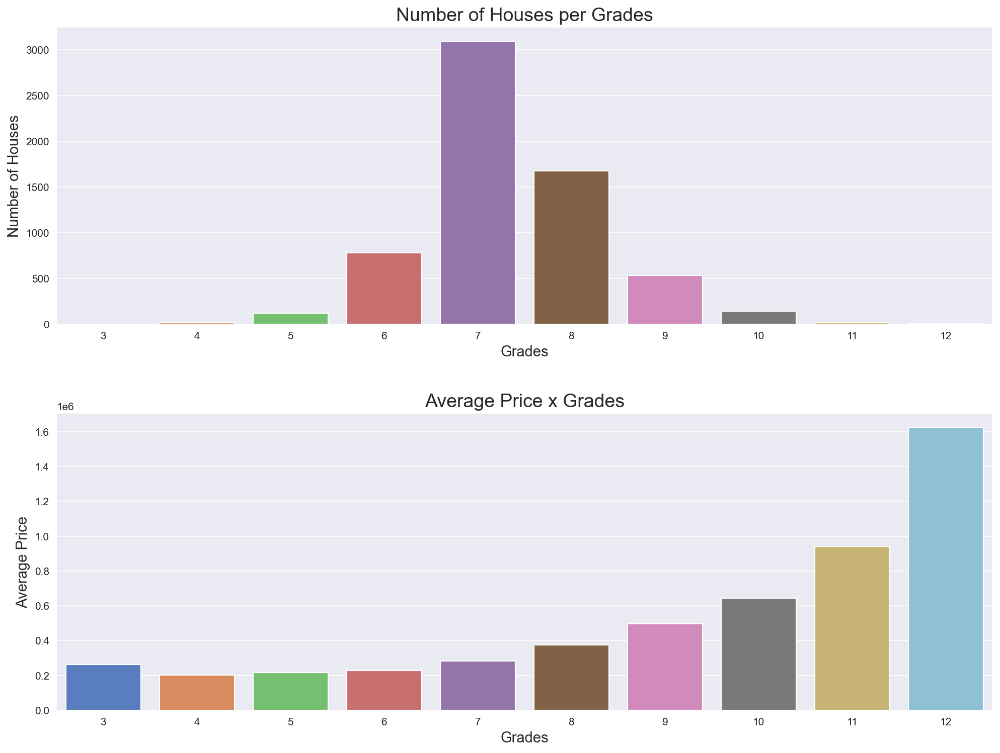

In [96]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,12)

# Plotting count graph
plt.subplot(2,1,1)
gr = sns.countplot(south['grade'])

# title and labels
set_plots_features(gr, 'Number of Houses per Grades', 'Grades',
                   'Number of Houses')

# Plotting bar graph
plt.subplot(2,1,2)
gr = sns.barplot(x = 'grade', y = 'price', data= south_grade)

# Title and labels
set_plots_features(gr, 'Average Price x Grades', 'Grades', 'Average Price')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

In the South region, we can see from the graph that most of the houses have grades 7 and 8, that is, their constructions are considered average. On the second graphic, we affirm that there is an equivalence between the average prices of houses with grades 4, 5 and 6. And also houses with grades 3 are more valued. Therefore, for the South region the hypothesis is **FALSE**.

### H9. Summer should be the season that sells most houses.
**FALSE:** Summer is not the season that sells most houses.

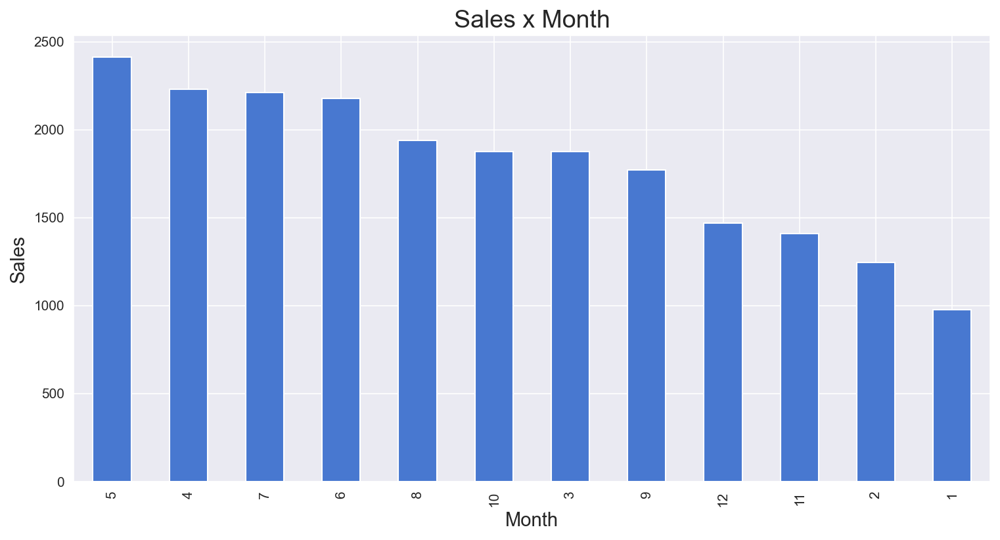

In [97]:
# Month of sale of the houses
house_sale = df4['month_sale'].value_counts()

fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(12,6)

# Plotting bar
gr = house_sale.plot(kind = 'bar')

# Title and labels
set_plots_features(gr, 'Sales x Month', 'Month', 'Sales')

# Display the plot
plt.show()

We can see from the graph that summer is not the season that sells more houses. Most sales take place, between fall and summer, in the months of **May, April, July and June**. Therefore, the hypothesis that in the summer the biggest sales occur is **FALSE**.

### H10. Houses in the North/Seattle region should be valued more than houses in the Mountains and South region.
**TRUE:** Houses in the North/Seattle region are more valued than houses in the South and Mountain region.

In [98]:
# Selecting and grouping by variables
montains_north_south = df4[['region', 'price']].groupby('region').mean().reset_index()
montains_north_south = round(montains_north_south, 2)
montains_north_south

,region,price
0,Montains,425842.14
1,North/Seattle,632590.94
2,South,328568.27


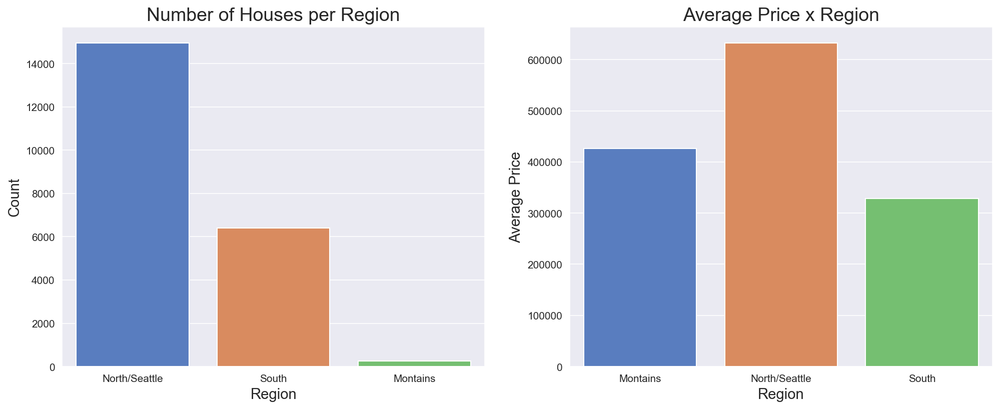

In [99]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,6)

# Plotting Counting Graph
plt.subplot(1,2,1)
gr = sns.countplot(df4['region'])
set_plots_features(gr, 'Number of Houses per Region', 'Region', 'Count')

# Plotting bar graph
plt.subplot(1,2,2)
gr = sns.barplot(x = 'region', y = 'price', data = montains_north_south)
set_plots_features(gr,'Average Price x Region', 'Region', 'Average Price')

# Exibição do gráfico
plt.show()

Looking at the graph, we have the comparison of the average prices of the three regions. Thus, we conclude that the region that houses in the North/Seattle region are more valued than houses in the Mountains region and houses in the South region. And also to say that houses from the Mountains region are more valued than houses from the South region. We also consider that the North/Seattle Region has the highest number of houses, followed by the South Region and Mountain Region.

> Therefore, the hypothesis is **TRUE**.

### H11. Waterfront houses should be more valued.
**TRUE:** Waterfront houses are more valued.

In [100]:
# Selecting and grouping by variables
house_water = df4[['waterfront', 'price']].groupby(['waterfront']).mean().reset_index()

In [101]:
# Number of houses per water view
df4['waterfront'].value_counts()

no     21434
yes      163
Name: waterfront, dtype: int64

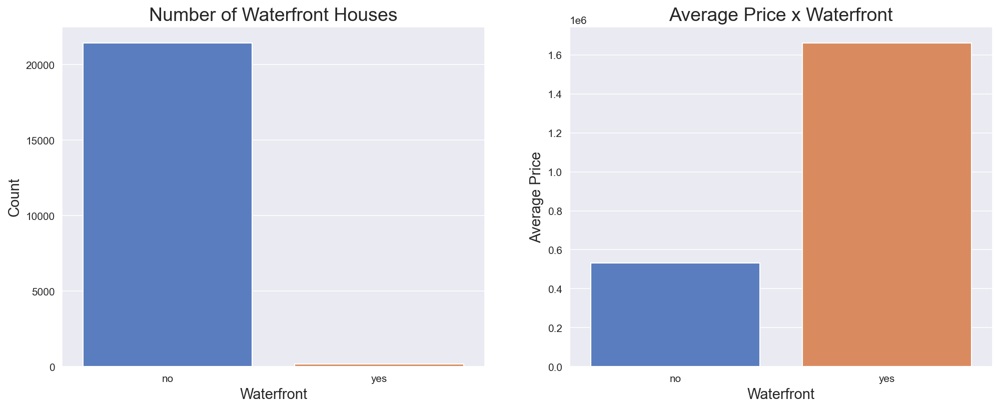

In [102]:
fig, gr = plt.subplots(dpi=150)

# Figure Size
gr.figure.set_size_inches(16,6)

# Plotando gráfico de dispersão
plt.subplot(1,2,1)
gr = sns.countplot(df4['waterfront'])
set_plots_features(gr,'Number of Waterfront Houses', 'Waterfront', 'Count')

# Plotando gráfico de barras
plt.subplot(1,2,2)
gr = sns.barplot(x = 'waterfront', y = 'price', data = house_water)
set_plots_features(gr, 'Average Price x Waterfront', 'Waterfront', 'Average Price')

# Exibição do gráfico
plt.show()

Even with the number of houses that have no view of water being higher than houses that have a view of water, we observed that the average price of houses with a view of water is more valued than houses that have no view of water. Therefore, the validity of the hypothesis is **TRUE**.

## 4.3 Multivariate Analysis

In the multivariate analysis, we will measure the degree of relationship between variables and their impacts. Then, we will do this analysis for the numerical variables and the categorical variables.

### 4.3.1 Numerical Variable

The correlation table below provides a summary of the correlation between the continuous variables of the data. The objective behind the correlation analysis between the continuous variables in the data is to identify those variables that have a significant linear relationship with price and those that do not. 

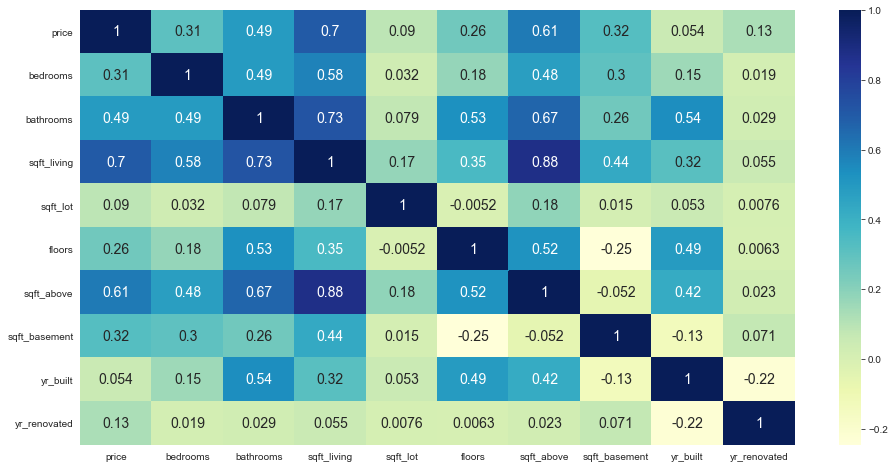

In [103]:
# Correlation between variables
correlacao = est.corr(method='pearson')

fig, gr = plt.subplots()

# Figure Size
gr.figure.set_size_inches(16,8)

# Plotting the heat map
sns.heatmap(correlacao, annot=True, annot_kws={'fontsize': 14}, cmap = 'YlGnBu')

# Display the plot
plt.show()

**Observations:**

* The `price` response variable has a strong positive correlation with `sqft_living` and a moderate positive correlation with number of `bathrooms` and `sqft_above`.


* The `price` response variable has a low positive correlation with number of `bedrooms`, `floors`, `bathrooms`.


* The `price` response shows a non-significant correlation with area_batch, `condition`, `yr_built`.


* The correlation of the variables `sqft_above`, `bathrooms`, `grade` and `bedrooms` with `sqft_living` have a high positive correlation and can explain the same price variation as `sqft_living`.

### 4.3.2 Categorical Variable

To calculate the correlation between two categorical variables, we use a measure of association. And the measure of association we will use is <a href='https://en.wikipedia.org/wiki/Cram%C3%A9r%27s_V'>Cramer V</a>. Therefore, I will remember the categorical variables.

In [104]:
cat_atr.head()

,waterfront,condition,grade
0,no,Média,7
1,no,Média,7
2,no,Média,6
3,no,Muito Bom,7
4,no,Média,8


To use Cramer V, we will use a function that is based on the literature that was available.

In [105]:
from scipy import stats as ss
#cramer V
def cramer_v(var_x, var_y):
    # Construção da matriz de confusão
    confusion_matrix = pd.crosstab(var_x, var_y).values
    
    # Sum of all values in the matrix
    n = confusion_matrix.sum()
    
    # Rows, Cols
    r, k = confusion_matrix.shape
    
    # Qui-squared
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    
    # Correction bias
    chi2corr = max(0, chi2 - (k-1) * (r-1) / (n-1))
    kcorr = k - (k-1) ** 2 / (n-1)
    rcorr = r - (r-1) ** 2 / (n-1)
    
    # Retur Cramer V
    return np.sqrt((chi2corr/n) / min(kcorr-1, rcorr-1))

In [106]:
# Combinations between the categorical variables

a1 = cramer_v(cat_atr['waterfront'], cat_atr['waterfront'])
a2 = cramer_v(cat_atr['waterfront'], cat_atr['condition'])
a3 = cramer_v(cat_atr['waterfront'], cat_atr['grade'])

a4 = cramer_v(cat_atr['condition'], cat_atr['waterfront'])
a5 = cramer_v(cat_atr['condition'], cat_atr['condition'])
a6 = cramer_v(cat_atr['condition'], cat_atr['grade'])

a7 = cramer_v(cat_atr['grade'], cat_atr['waterfront'])
a8 = cramer_v(cat_atr['grade'], cat_atr['condition'])
a9 = cramer_v(cat_atr['grade'], cat_atr['grade'])

# Set of Correlations
d = pd.DataFrame({'waterfront': [a1, a2, a3],
              'condition': [a4, a5, a6],
              'grade': [a7, a8, a9],
             })

# Indice igual ao das colunas
d = d.set_index(d.columns)

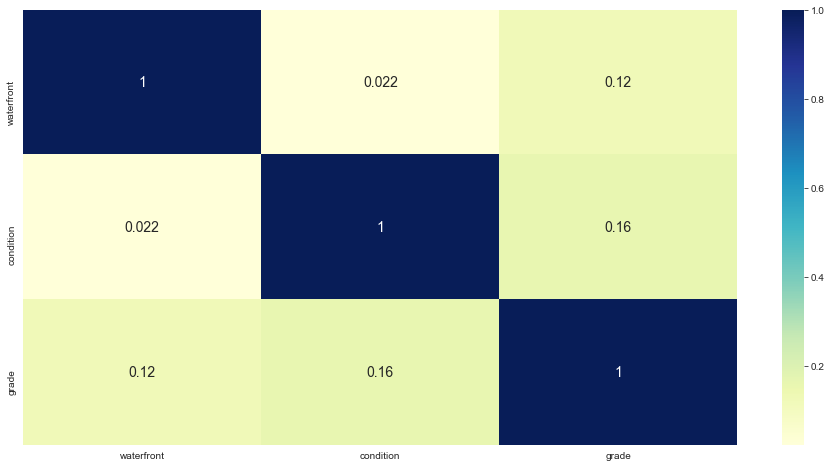

In [107]:
fig, ax = plt.subplots()

# Figure Size
ax.figure.set_size_inches(16, 8)

# plotting heatmap 
sns.heatmap(d, annot=True, annot_kws={"fontsize":14}, cmap = 'YlGnBu')


# Display the plot
plt.show()

**Observations:**

* The correlations between all the variables involved are independent, as they are all negligible coefficients close to zero. 

# 5.0 Answering the Questions

At this stage, we will compare house prices by region, taking into consideration the most correlated characteristics of the houses, according to the validation of the hypotheses to choose the properties with attractive prices for investment. Therefore, the relevant variables for this analysis are: `bedrooms, bathrooms, grade and note`. Therefore, through these variables it is already possible to define answers and conclusions to answer CEO's questions.

## 5.1. Which houses should the CEO of House Rocket buy and for which purchase price?

Real estate in the south region is less valued compared to the prices in the north/seattle and mountain regions according to Hypothesis 10. However, in these more valued regions there are business opportunities that are interesting for investment.

Thus, as a suggestion, the houses, which the CEO should buy, are those with the same characteristics and whose prices are below the average price of their respective regions. That is, houses that have a price lower than the average price, with discounts from 20% (of the average price), because this guarantees significant gains in future sales. These purchase suggestions are divided by regions performed in functions `nort()`, `mont()` and `su()`.

**NOTE**: Only a suggestion of value for the purchase of houses was given as an answer, but the CEO will be able to observe the other properties that have a lower percentage and make his decisions according to the tables.

### 5.1.1. Montains Region

In [108]:
# Number of houses, room numbers and bathroom numbers
montains.shape, montains['bedrooms'].unique(), montains['bathrooms'].unique()

((250, 20),
 array([3, 2, 4, 1, 5], dtype=int64),
 array([3, 1, 2, 4, 5, 6], dtype=int64))

In [109]:
mont(1,1)

Average Price: US$ 288183.33


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
2927,8649401270,167000.0,1,1,780,6,no,42.05
16842,226109056,170000.0,1,1,850,6,no,41.01


In [110]:
mont(2,1)

Average Price: US$ 248671.67


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
13072,1437500035,155000.0,2,1,1010,5,no,37.67
10169,8570900162,193500.0,2,1,950,7,no,22.19
9502,3734900110,230000.0,2,1,890,6,no,7.51
11916,9407000990,239900.0,2,1,910,6,no,3.53
17479,323089005,240000.0,2,1,1120,5,no,3.49


In [111]:
mont(2,2)

Average Price: US$ 348155.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
10095,7805600070,200000.0,2,2,1320,7,no,42.55
4930,9407111100,220650.0,2,2,1460,7,no,36.62
14736,4032500035,295000.0,2,2,1560,8,no,15.27


In [112]:
mont(2,3)

Average Price: US$ 1998000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
6691,2624089007,1998000.0,2,3,3900,12,no,0.0


In [113]:
mont(3,1)

Average Price: US$ 258598.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
19650,2626119062,155000.0,3,1,1300,7,no,40.06
14615,8649400790,160000.0,3,1,1340,5,no,38.13
16941,2626119028,160000.0,3,1,1140,6,no,38.13
618,9407110700,175000.0,3,1,1250,7,no,32.33
19523,9407000230,240000.0,3,1,1600,7,no,7.19
9123,9407111250,245000.0,3,1,1020,7,no,5.26
258,9407100800,255000.0,3,1,1230,7,no,1.39
11590,8570900023,255000.0,3,1,1250,6,no,1.39


In [114]:
mont(3,2)

Average Price: US$ 353772.64


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
3369,9407101380,189000.0,3,2,1460,7,yes,46.58
2493,9407110710,195000.0,3,2,1510,7,yes,44.88
12861,7334500120,240000.0,3,2,1360,7,no,32.16
7602,9407001500,270000.0,3,2,1390,7,no,23.68
2674,9407001610,271900.0,3,2,1890,7,yes,23.14
16785,9407100500,273000.0,3,2,1540,6,no,22.83
16559,2124089028,279000.0,3,2,1430,7,yes,21.14
10575,1223089050,280000.0,3,2,1630,7,no,20.85
6857,9407110680,280000.0,3,2,1370,7,no,20.85
5525,9407000840,288000.0,3,2,1660,7,yes,18.59


In [115]:
mont(3,3)

Average Price: US$ 465308.03


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
7438,1223089016,325000.0,3,3,2450,7,yes,30.15
3243,7334501250,325000.0,3,3,1870,7,yes,30.15
10579,9407101180,345000.0,3,3,2020,7,no,25.86
2610,1422300160,379000.0,3,3,1740,8,no,18.55
3295,9413400165,380000.0,3,3,1860,7,no,18.33
14709,8039900360,383000.0,3,3,2090,7,no,17.69
19264,2607730110,391500.0,3,3,1920,8,no,15.86
19980,774100475,415000.0,3,3,2600,8,no,10.81
18167,2607730490,417000.0,3,3,1840,8,no,10.38
10971,2623089135,427000.0,3,3,1830,8,yes,8.23


In [116]:
mont(3,4)

Average Price: US$ 830000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
7653,2523089110,830000.0,3,4,3820,9,yes,0.0


In [117]:
mont(4,1)

Average Price: US$ 320000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
15773,2624089026,275000.0,4,1,1430,5,no,14.06


In [118]:
mont(4,2)

Average Price: US$ 310600.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
18396,7334600730,259000.0,4,2,1580,7,no,16.61
10962,7334401040,271000.0,4,2,1800,7,no,12.75


In [119]:
mont(4,3)

Average Price: US$ 518655.5


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
10088,7787110510,397000.0,4,3,2320,8,no,23.46
11918,7787110370,447000.0,4,3,2660,8,no,13.82
20669,8564860270,449990.0,4,3,2680,8,no,13.24
19240,1151100035,450000.0,4,3,2300,7,no,13.24
3731,2607740100,470000.0,4,3,2520,8,no,9.38
2666,2607760890,471000.0,4,3,3030,8,yes,9.19
10194,7787120260,471000.0,4,3,2330,8,no,9.19
20255,1442870440,475000.0,4,3,2620,8,no,8.42
18285,2623089141,476500.0,4,3,2250,8,no,8.13
15220,2607760190,480000.0,4,3,2180,8,no,7.45


In [120]:
mont(4,4)

Average Price: US$ 861618.75


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
4387,3523089019,480000.0,4,4,3370,9,no,44.29
17247,9510310280,696000.0,4,4,3650,9,yes,19.22
16009,1923099034,775000.0,4,4,3970,9,no,10.05
7769,2323089009,855000.0,4,4,4030,10,no,0.77


In [121]:
mont(5,2)

Average Price: US$ 395000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
19223,9407001830,338000.0,5,2,1860,7,no,14.43


### 5.1.2. North/Seattle Region

In [122]:
# Number of houses, room numbers and bathroom numbers
north.shape, north['bedrooms'].unique(), north['bathrooms'].unique()

((14954, 20),
 array([ 3,  2,  4,  5,  1,  6,  7,  8,  9, 11, 10], dtype=int64),
 array([1, 3, 2, 5, 4, 6, 8, 7], dtype=int64))

In [123]:
nort(1,1)

Average Price: US$ 326043.81


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
7992,2734100835,90000.0,1,1,780,5,no,72.40
19417,3163600076,152275.0,1,1,1020,6,no,53.30
3984,7883607645,155000.0,1,1,720,6,no,52.46
14366,3333002450,165000.0,1,1,850,6,no,49.39
6120,7135300275,185000.0,1,1,720,6,no,43.26
9545,2658000115,190000.0,1,1,720,6,no,41.73
16829,3278602660,194000.0,1,1,820,8,yes,40.50
19225,2414600366,199900.0,1,1,720,6,no,38.69
1975,5101404170,200000.0,1,1,680,5,no,38.66
1629,6414600070,210000.0,1,1,930,6,no,35.59


In [124]:
nort(1,2)

Average Price: US$ 415418.75


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
903,3278600710,200000.0,1,2,1010,8,yes,51.86
21226,3278600680,235000.0,1,2,1170,8,yes,43.43
21443,3278600750,250000.0,1,2,1180,8,yes,39.82
17868,2131700900,283700.0,1,2,1010,6,no,31.71
19885,424049284,310000.0,1,2,1120,7,no,25.38
9406,2026079055,380000.0,1,2,1200,7,no,8.53
13576,9269200150,390000.0,1,2,1440,7,yes,6.12
2156,4315700390,410000.0,1,2,1010,7,no,1.30
1653,2025079033,415000.0,1,2,3000,8,no,0.10


In [125]:
nort(1,3)

Average Price: US$ 516225.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
5369,6450304600,315000.0,1,3,1940,7,yes,38.98
7725,3876313030,458000.0,1,3,2140,7,yes,11.28


In [126]:
nort(2,1)

Average Price: US$ 387522.65


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
6557,8151600470,121800.0,2,1,940,5,no,68.57
14268,6450302546,130000.0,2,1,840,7,no,66.45
8461,4006000401,140000.0,2,1,900,6,no,63.87
5816,7568700480,153000.0,2,1,1140,6,yes,60.52
4768,4045500130,154000.0,2,1,1040,6,no,60.26
9479,1443500385,155000.0,2,1,910,6,no,60.00
12344,4140900270,160000.0,2,1,1140,8,no,58.71
4558,423049067,160000.0,2,1,930,6,no,58.71
281,6874200960,170000.0,2,1,860,6,no,56.13
5916,6303400290,170000.0,2,1,860,6,no,56.13


In [127]:
nort(2,2)

Average Price: US$ 472901.73


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
8355,13002460,205000.0,2,2,1740,6,yes,56.65
2032,2414600400,210000.0,2,2,1190,6,no,55.59
19501,3878900464,229500.0,2,2,1870,7,yes,51.47
7520,1049000740,229950.0,2,2,1160,7,no,51.37
20839,2895800640,239800.0,2,2,1290,8,no,49.29
8595,6303401395,245000.0,2,2,1220,6,no,48.19
12959,8165100035,245560.0,2,2,1260,7,no,48.07
3343,7132300042,247300.0,2,2,1140,7,yes,47.71
5535,1445200050,250000.0,2,2,1160,7,yes,47.13
7618,3644100065,257000.0,2,2,1220,6,yes,45.65


In [128]:
nort(2,3)

Average Price: US$ 547843.89


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
21293,8862500280,208400.0,2,3,1570,7,no,61.96
88,1332700270,215000.0,2,3,1610,7,no,60.76
21183,5528600005,272167.0,2,3,1620,7,no,50.32
20254,1332700020,278000.0,2,3,1610,7,no,49.26
1102,3278604400,285000.0,2,3,1380,7,yes,47.98
20678,1332700030,293000.0,2,3,1610,7,no,46.52
21156,3278612570,294000.0,2,3,1380,7,yes,46.34
20559,3438501320,295000.0,2,3,1630,7,yes,46.15
19648,2114700368,299000.0,2,3,1400,8,yes,45.42
21559,3438501329,305000.0,2,3,1590,7,yes,44.33


In [129]:
nort(2,4)

Average Price: US$ 829800.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
19339,3019300090,535000.0,2,4,2560,6,yes,35.53
10392,8129700565,601450.0,2,4,1840,8,no,27.52
19454,3425059076,780000.0,2,4,3000,10,yes,6.00


In [130]:
nort(3,1)

Average Price: US$ 405479.19


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
17602,795000620,115000.0,3,1,1080,5,no,71.64
5527,3821200050,119500.0,3,1,1170,6,no,70.53
17603,795000620,124000.0,3,1,1080,5,no,69.42
16893,3501100050,125000.0,3,1,1230,6,no,69.17
18332,9272202260,130000.0,3,1,1200,7,no,67.94
12724,13001215,130000.0,3,1,1100,7,no,67.94
1222,1238500451,130000.0,3,1,1110,7,no,67.94
15062,2788400020,150000.0,3,1,1200,7,no,63.01
2183,4058802105,150000.0,3,1,1450,7,no,63.01
8725,7883603425,155000.0,3,1,1250,7,yes,61.77


In [131]:
nort(3,2)

Average Price: US$ 514637.48


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
11995,2724049185,175000.0,3,2,1430,6,no,66.00
19975,6056100165,175003.0,3,2,1390,7,no,65.99
16082,1035000007,210000.0,3,2,1830,7,yes,59.19
5183,2328800130,220000.0,3,2,1900,7,yes,57.25
8263,1105000432,224000.0,3,2,1440,7,no,56.47
19371,3352401037,224000.0,3,2,1760,7,yes,56.47
13178,8658300455,225000.0,3,2,1390,6,no,56.28
8505,1237500540,225000.0,3,2,1370,6,no,56.28
9032,623049273,225000.0,3,2,1550,7,no,56.28
12668,4006000281,227000.0,3,2,2380,6,yes,55.89


In [132]:
nort(3,3)

Average Price: US$ 608311.29


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
14548,2734100736,249950.0,3,3,1790,7,yes,58.91
8447,7227800025,250000.0,3,3,2300,7,no,58.90
13558,2114700040,260000.0,3,3,1730,7,yes,57.26
4232,3395041194,268000.0,3,3,1880,7,yes,55.94
326,3530210260,274975.0,3,3,3030,9,no,54.80
16234,3395041206,285000.0,3,3,1800,7,no,53.15
11960,393000311,286300.0,3,3,2000,8,yes,52.94
6119,1559900080,289200.0,3,3,1760,7,no,52.46
4618,2114700115,291700.0,3,3,1970,6,yes,52.05
18001,4036400110,300000.0,3,3,2340,8,yes,50.68


In [133]:
nort(3,4)

Average Price: US$ 800783.67


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
19067,3782760040,402500.0,3,4,2780,8,no,49.74
2059,4073800140,429000.0,3,4,2210,8,yes,46.43
17859,4058800215,430000.0,3,4,3890,8,yes,46.30
87,3342103156,461000.0,3,4,2770,9,yes,42.43
19408,3204800150,470000.0,3,4,2070,8,yes,41.31
4451,1769600147,477590.0,3,4,2260,8,yes,40.36
6887,7129301578,495000.0,3,4,2380,8,yes,38.19
13204,3575302245,500000.0,3,4,2150,8,yes,37.56
20172,6979970080,525000.0,3,4,2876,8,yes,34.44
3857,9830200475,525000.0,3,4,2200,7,yes,34.44


In [134]:
nort(3,5)

Average Price: US$ 1896350.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
9902,8651611260,858450.0,3,5,3840,10,no,54.73
471,8651611170,868700.0,3,5,3840,10,no,54.19
21494,2413910120,915000.0,3,5,3850,10,yes,51.75
450,4055700030,1450000.0,3,5,3970,10,yes,23.54


In [135]:
nort(4,1)

Average Price: US$ 448254.31


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
13519,723049158,135000.0,4,1,1460,5,no,69.88
8087,7973202225,154200.0,4,1,1310,6,yes,65.60
16092,8122600020,200000.0,4,1,1310,6,yes,55.38
17236,316000190,219000.0,4,1,1370,6,no,51.14
16924,2760200050,226000.0,4,1,1270,7,no,49.58
15266,3438502066,229000.0,4,1,1320,7,no,48.91
17635,4006000423,230000.0,4,1,1870,6,yes,48.69
14247,316000145,235000.0,4,1,1360,6,no,47.57
2481,7186800105,236500.0,4,1,2140,6,yes,47.24
18113,123039333,240000.0,4,1,1910,6,no,46.46


In [136]:
nort(4,2)

Average Price: US$ 552591.06


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
10916,7227800055,199500.0,4,2,1750,5,no,63.90
3083,5476200123,200000.0,4,2,2090,7,yes,63.81
881,2349300060,200000.0,4,2,1920,6,yes,63.81
10884,7972604425,210750.0,4,2,1840,7,no,61.86
10033,4440400125,228000.0,4,2,2000,7,yes,58.74
18733,7663700401,229000.0,4,2,1820,7,no,58.56
11499,986000045,240000.0,4,2,2020,7,yes,56.57
10917,7227800055,247000.0,4,2,1750,5,no,55.30
8518,4038000040,250000.0,4,2,1910,7,no,54.76
10724,4279900140,251000.0,4,2,1650,7,yes,54.58


In [137]:
nort(4,3)

Average Price: US$ 728762.57


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
17261,5300200050,280000.0,4,3,2230,7,yes,61.58
17548,6885900415,290000.0,4,3,2240,7,yes,60.21
13074,7129304225,305000.0,4,3,2340,7,no,58.15
12875,7417100133,310000.0,4,3,2320,7,no,57.46
371,2231500030,315000.0,4,3,2180,7,yes,56.78
...,...,...,...,...,...,...,...,...
8571,225039177,726500.0,4,3,2180,8,no,0.31
12829,7215730410,727000.0,4,3,3150,9,no,0.24
15904,8691390980,728000.0,4,3,3290,9,no,0.10
12467,3591000030,728000.0,4,3,2650,9,no,0.10


In [138]:
nort(4,5)

Average Price: US$ 1661094.72


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
12228,6708200320,599000.0,4,5,3700,7,yes,63.94
20966,3825310180,860000.0,4,5,4040,9,yes,48.23
20381,8562710250,890000.0,4,5,4420,10,yes,46.42
2644,7018000560,925000.0,4,5,3770,8,no,44.31
8195,2526069095,955000.0,4,5,5660,10,yes,42.51
20534,2126059294,960000.0,4,5,3720,10,no,42.21
3378,3629921240,970000.0,4,5,3890,11,yes,41.60
21283,2937300050,988990.0,4,5,4150,9,no,40.46
12298,4139460390,995000.0,4,5,3850,10,yes,40.10
11980,3425069083,1005000.0,4,5,4225,11,no,39.50


In [139]:
nort(4,6)

Average Price: US$ 2033000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
3121,7237500590,1320000.0,4,6,6110,11,no,35.07
20452,1125079111,1600000.0,4,6,6530,11,no,21.30
18287,1524079188,1862000.0,4,6,5240,10,no,8.41
6501,2626069030,1940000.0,4,6,7220,12,yes,4.57


In [140]:
nort(5,1)

Average Price: US$ 551584.85


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
10408,623049185,185000.0,5,1,1590,6,yes,66.46
18677,5300200085,262000.0,5,1,1870,7,yes,52.50
9572,5589300205,274000.0,5,1,1680,7,yes,50.32
8453,9358001590,340000.0,5,1,1880,6,yes,38.36
14506,826059152,435000.0,5,1,2170,7,yes,21.14
4174,2461900945,438000.0,5,1,1950,7,yes,20.59
8182,9218400088,495000.0,5,1,1810,7,no,10.26
9738,8701600030,518000.0,5,1,1590,7,yes,6.09
17769,1238500281,539000.0,5,1,1700,7,no,2.28
5435,6840701150,540000.0,5,1,2480,7,yes,2.10


In [141]:
nort(5,2)

Average Price: US$ 551315.3


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
2447,7206900075,200000.0,5,2,1770,7,no,63.72
5497,1721800470,230000.0,5,2,1930,6,no,58.28
4556,4270600025,245000.0,5,2,2020,7,yes,55.56
1128,8062900070,272000.0,5,2,2550,7,yes,50.66
12981,3920000040,280000.0,5,2,2110,7,yes,49.21
14455,1061500360,287000.0,5,2,2040,7,yes,47.94
16671,9250900104,300000.0,5,2,2110,7,yes,45.58
12810,3705900124,302000.0,5,2,2360,7,yes,45.22
5774,1775800280,310000.0,5,2,2900,7,no,43.77
16414,3649100346,322968.0,5,2,1890,7,no,41.42


In [142]:
nort(5,3)

Average Price: US$ 765313.43


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
7650,626049058,275000.0,5,3,2570,7,yes,64.07
10016,5476800069,292050.0,5,3,2840,7,yes,61.84
20652,7883603648,300000.0,5,3,2760,8,no,60.80
13671,7129800063,330000.0,5,3,2390,7,yes,56.88
16472,7905380080,330000.0,5,3,2620,7,yes,56.88
17652,1773100620,350000.0,5,3,2320,7,yes,54.27
9938,8842400071,352000.0,5,3,2420,7,yes,54.01
20887,133000271,355000.0,5,3,2540,7,no,53.61
20770,9310300160,357000.0,5,3,2990,8,no,53.35
18799,9282801450,361000.0,5,3,2380,7,yes,52.83


In [143]:
nort(5,4)

Average Price: US$ 1105191.13


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
15890,1525069088,442500.0,5,4,4240,8,yes,59.96
2262,8035350260,455000.0,5,4,3080,8,yes,58.83
19770,2619950060,465000.0,5,4,3210,8,yes,57.93
5722,1526079026,487500.0,5,4,3530,7,yes,55.89
21372,6169901185,490000.0,5,4,4460,10,yes,55.66
15382,5710610250,500000.0,5,4,3130,8,yes,54.76
7137,7853250080,510000.0,5,4,3400,8,yes,53.85
15413,9414610020,574950.0,5,4,3160,8,no,47.98
2119,824069121,585000.0,5,4,3180,7,yes,47.07
12589,2459900040,587000.0,5,4,3610,7,no,46.89


In [144]:
nort(5,5)

Average Price: US$ 1706443.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
17471,2205700470,650500.0,5,5,3920,7,no,61.88
20251,7853440050,771005.0,5,5,4000,9,no,54.82
20607,7853280370,805000.0,5,5,4600,9,yes,52.83
19751,7853280350,809000.0,5,5,4630,9,yes,52.59
9256,8562750220,811500.0,5,5,3970,9,yes,52.44
11441,3629860060,827500.0,5,5,3920,9,yes,51.51
10815,2325069032,875000.0,5,5,4720,11,yes,48.72
12586,4139450760,932808.0,5,5,4690,10,yes,45.34
14980,8089510170,935000.0,5,5,4230,10,no,45.21
1122,293760310,975000.0,5,5,4300,10,no,42.86


In [145]:
nort(5,6)

Average Price: US$ 3121753.85


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
21050,2424059170,900000.0,5,6,7120,12,yes,71.17
16773,1630700380,1920000.0,5,6,7730,12,yes,38.50
10373,3303850390,2983000.0,5,6,7400,13,yes,4.44


In [146]:
nort(5,7)

Average Price: US$ 3273722.5


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
21506,2524069097,2238890.0,5,7,7270,12,yes,31.61
14556,2303900035,2888000.0,5,7,8670,13,yes,11.78


In [147]:
nort(6,1)

Average Price: US$ 590833.33


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
12338,5132000140,175000.0,6,1,1370,6,yes,70.38
12339,5132000140,415000.0,6,1,1370,6,yes,29.76
3613,809000945,563000.0,6,1,1730,7,yes,4.71


In [148]:
nort(6,2)

Average Price: US$ 545631.25


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
2306,3145600045,302000.0,6,2,2650,8,no,44.65
9720,2568300045,305000.0,6,2,1900,7,yes,44.10
3648,7338402690,335000.0,6,2,2020,7,yes,38.60
18703,3558900590,360000.0,6,2,2230,7,yes,34.02
9776,2224700045,375000.0,6,2,1900,7,yes,31.27
2310,2724069117,380000.0,6,2,1870,7,no,30.36
3079,4027700853,387500.0,6,2,2400,6,yes,28.98
2382,7129300400,400000.0,6,2,2350,8,yes,26.69
6757,4112100101,415000.0,6,2,2500,8,yes,23.94
14987,9187200095,432500.0,6,2,3080,7,no,20.73


In [149]:
nort(6,3)

Average Price: US$ 758314.09


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
10993,6888900060,326000.0,6,3,2580,7,yes,57.01
4639,7972601250,360000.0,6,3,2850,7,yes,52.53
11764,1774000030,395000.0,6,3,2950,7,yes,47.91
6303,6152900402,410000.0,6,3,2520,7,yes,45.93
8724,3876000970,429300.0,6,3,2930,8,yes,43.39
1986,8822901200,430000.0,6,3,2630,7,yes,43.30
17173,3336000050,435000.0,6,3,3560,7,yes,42.64
8109,2124049160,440000.0,6,3,2510,7,yes,41.98
1718,226039282,442500.0,6,3,2800,7,yes,41.65
16554,1133000235,450000.0,6,3,3550,8,yes,40.66


In [150]:
nort(6,4)

Average Price: US$ 942347.87


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
12907,2113700360,315000.0,6,4,3120,7,yes,66.57
1752,254000445,480000.0,6,4,2940,7,no,49.06
4197,3834500195,527000.0,6,4,3000,8,yes,44.08
6873,7852190050,620000.0,6,4,3600,8,yes,34.21
1228,5249800729,680000.0,6,4,3000,8,yes,27.84
15841,1377800277,696000.0,6,4,2900,8,yes,26.14
4344,993000090,752000.0,6,4,3810,8,no,20.20
9610,993000100,760000.0,6,4,3810,8,no,19.35
13458,9547200530,780000.0,6,4,3300,8,yes,17.23
8966,2767601280,848750.0,6,4,3160,8,no,9.93


In [151]:
nort(6,5)

Average Price: US$ 1350724.21


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
9812,9265200060,650000.0,6,5,3900,8,yes,51.88
11978,7228501805,739000.0,6,5,4000,7,no,45.29
19709,3575303430,780000.0,6,5,4310,8,yes,42.25
15793,7013200280,989000.0,6,5,3830,9,yes,26.78
11685,1126069045,1135000.0,6,5,6900,9,yes,15.97
15222,1424069069,1150000.0,6,5,6040,11,yes,14.86
4255,913000315,1300000.0,6,5,3902,9,yes,3.76
9076,2424059052,1325000.0,6,5,5720,10,yes,1.90


In [152]:
nort(6,6)

Average Price: US$ 2406166.67


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
20838,3425069117,1275000.0,6,6,6160,11,yes,47.01


In [153]:
nort(7,3)

Average Price: US$ 847000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
1241,7227802030,350000.0,7,3,2800,7,yes,58.68
1135,4024100951,420000.0,7,3,2940,8,yes,50.41
18823,4040500100,539000.0,7,3,2620,7,no,36.36
14915,9187200345,599000.0,7,3,2580,7,yes,29.28
12605,2862100366,730000.0,7,3,3110,7,yes,13.81
4717,2025049006,750000.0,7,3,3410,8,yes,11.45
7023,686400380,770000.0,7,3,3260,8,no,9.09


In [154]:
nort(7,4)

Average Price: US$ 810932.08


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
13120,6453300306,419000.0,7,4,4340,7,yes,48.33
8120,4006000183,450000.0,7,4,3150,8,no,44.51
14201,6190701484,450000.0,7,4,2830,8,yes,44.51
10787,6411600370,475000.0,7,4,2870,7,yes,41.43
9732,263000324,550000.0,7,4,3440,7,no,32.18


In [155]:
nort(7,5)

Average Price: US$ 1703983.33


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
12765,7663700968,565000.0,7,5,4140,7,yes,66.84
3721,5451100490,884900.0,7,5,5370,8,no,48.07


In [156]:
nort(8,3)

Average Price: US$ 789000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
6174,1873400020,340000.0,8,3,2790,7,yes,56.91
19302,3756900027,575000.0,8,3,3840,7,yes,27.12
15670,8141200080,680000.0,8,3,2530,7,yes,13.81


In [157]:
nort(8,4)

Average Price: US$ 1744500.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
9452,2769600590,900000.0,8,4,4020,8,yes,48.41


In [158]:
nort(9,3)

Average Price: US$ 817000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
4235,2902200015,700000.0,9,3,3680,7,yes,14.32


In [159]:
nort(9,5)

Average Price: US$ 939999.5


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
4096,1997200215,599999.0,9,5,3830,7,yes,36.17


In [160]:
nort(10,2)

Average Price: US$ 650000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
15161,5566100170,650000.0,10,2,3610,7,yes,0.0


In [161]:
nort(10,3)

Average Price: US$ 660000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
19254,8812401450,660000.0,10,3,2920,7,yes,0.0


In [162]:
nort(10,6)

Average Price: US$ 1148000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
13314,627300145,1148000.0,10,6,4590,9,yes,0.0


In [163]:
nort(11,3)

Average Price: US$ 520000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
8757,1773100755,520000.0,11,3,3000,7,yes,0.0


### 5.1.3 South Region

In [164]:
# Number of houses, room numbers and bathroom numbers
south.shape, south['bedrooms'].unique(), south['bathrooms'].unique()

((6393, 20),
 array([3, 2, 5, 4, 6, 1, 7, 8], dtype=int64),
 array([3, 2, 1, 4, 5, 6, 7], dtype=int64))

In [165]:
su(1,1)

Average Price: US$ 234896.39


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
3805,7335400215,95000.0,1,1,760,5,no,59.56
10140,2648500030,112000.0,1,1,1080,6,no,52.32
8080,1545807810,118000.0,1,1,670,6,no,49.77
9820,3598600049,124000.0,1,1,840,6,no,47.21
16952,2722059292,129000.0,1,1,650,5,no,45.08
4089,985001015,135000.0,1,1,790,6,no,42.53
5570,1735800050,142500.0,1,1,690,5,no,39.33
2031,2420069017,152900.0,1,1,900,6,no,34.91
648,922049078,157000.0,1,1,870,6,no,33.16
12830,3751600146,166000.0,1,1,1120,7,no,29.33


In [166]:
su(1,2)

Average Price: US$ 279564.29


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
12208,4031000520,115000.0,1,2,1150,7,no,58.86
16866,7841300285,199950.0,1,2,1048,7,no,28.48
5135,3530470190,220000.0,1,2,1100,8,no,21.31
12209,4031000520,227000.0,1,2,1150,7,no,18.80


In [167]:
su(1,3)

Average Price: US$ 329500.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
14186,7461400360,299000.0,1,3,1980,7,yes,9.26


In [168]:
su(2,1)

Average Price: US$ 218093.43


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
18468,7999600180,83000.0,2,1,900,5,no,61.94
16714,1322049150,85000.0,2,1,910,5,no,61.03
10253,2422049104,85000.0,2,1,830,6,no,61.03
10585,6198400218,95000.0,2,1,1070,6,no,56.44
5303,5128000010,99000.0,2,1,960,6,no,54.61
4563,1900000195,100000.0,2,1,930,6,no,54.15
15456,8856000545,100000.0,2,1,910,6,no,54.15
11932,723049326,104950.0,2,1,1170,6,no,51.88
13628,2023049218,105500.0,2,1,930,5,no,51.63
20962,1278000210,110000.0,2,1,828,6,no,49.56


In [169]:
su(2,2)

Average Price: US$ 311880.38


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
10105,5466310060,139500.0,2,2,1230,7,no,55.27
11255,1843200350,150000.0,2,2,1360,7,no,51.90
12289,2538800030,156601.0,2,2,1210,7,no,49.79
19131,2724201202,163000.0,2,2,1250,7,no,47.74
13815,3530430155,168000.0,2,2,1220,8,no,46.13
2352,7229700105,172500.0,2,2,1510,6,yes,44.69
4611,3523029059,181000.0,2,2,1560,7,no,41.96
18478,9268710220,186950.0,2,2,1390,7,no,40.06
107,3530510041,188500.0,2,2,1240,8,no,39.56
11419,7116500125,189000.0,2,2,1700,5,yes,39.40


In [170]:
su(2,3)

Average Price: US$ 407249.58


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
16274,5466300130,160000.0,2,3,1660,7,no,60.71
996,8856004730,199950.0,2,3,1590,5,no,50.90
8310,7841300535,225000.0,2,3,1560,5,yes,44.75
14591,2887970040,234950.0,2,3,1720,8,no,42.31
9971,8083350070,235000.0,2,3,1660,7,no,42.30
3022,3751604169,279000.0,2,3,1770,8,yes,31.49
7177,9542800050,287000.0,2,3,2410,7,yes,29.53
11324,6679000560,314950.0,2,3,1860,7,no,22.66
17800,3521059124,345000.0,2,3,2550,7,no,15.29
12046,2781250400,350500.0,2,3,1770,7,no,13.93


In [171]:
su(3,1)

Average Price: US$ 222710.38


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
18939,4239400300,90000.0,3,1,980,6,no,59.59
17197,5111400086,110000.0,3,1,1250,6,no,50.61
3870,7893203565,120000.0,3,1,1260,6,no,46.12
7847,2621600015,120000.0,3,1,1150,6,no,46.12
2941,1950900245,123300.0,3,1,1150,7,no,44.64
17233,6600410170,124740.0,3,1,1340,6,no,43.99
16838,723049530,126500.0,3,1,1130,6,no,43.20
15674,1898700050,128000.0,3,1,1400,7,no,42.53
12868,4014400237,132500.0,3,1,1080,7,no,40.51
1898,1697000400,133000.0,3,1,980,7,no,40.28


In [172]:
su(3,2)

Average Price: US$ 286581.12


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
10226,8945100320,136500.0,3,2,1420,6,no,52.37
19524,3306200230,147000.0,3,2,1480,7,yes,48.71
14756,5029451010,160000.0,3,2,1480,7,yes,44.17
18579,9265410090,160000.0,3,2,1370,7,no,44.17
7817,1311400120,160000.0,3,2,1610,7,no,44.17
15790,1311800130,162500.0,3,2,1390,7,no,43.30
9876,1219000473,164950.0,3,2,1570,7,yes,42.44
9482,2822049210,165000.0,3,2,1630,7,no,42.42
4312,4331000265,167000.0,3,2,1520,7,no,41.73
11775,2892700041,168000.0,3,2,1370,6,no,41.38


In [173]:
su(3,3)

Average Price: US$ 357006.86


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
12500,9211500730,162000.0,3,3,1810,7,yes,54.62
2379,3831200200,172040.0,3,3,1710,7,yes,51.81
15568,2560801222,180000.0,3,3,1990,7,no,49.58
2126,4345000510,180500.0,3,3,1800,7,no,49.44
11297,7682200340,182000.0,3,3,1960,7,yes,49.02
9337,9543000945,182500.0,3,3,1830,7,no,48.88
13023,9211500620,182700.0,3,3,1740,7,yes,48.82
14648,646910150,183750.0,3,3,1770,7,no,48.53
16521,1221000562,187000.0,3,3,1730,7,no,47.62
18590,2154900040,194250.0,3,3,2190,7,yes,45.59


In [174]:
su(3,4)

Average Price: US$ 735671.82


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
11338,9264911550,310000.0,3,4,3130,8,yes,57.86
8749,8856500220,375000.0,3,4,2760,9,yes,49.03
815,1421069208,379000.0,3,4,2660,8,no,48.48
17431,5592900020,410000.0,3,4,2650,8,yes,44.27
15935,6055000010,470000.0,3,4,3520,8,yes,36.11
9663,2794700120,496000.0,3,4,3090,9,yes,32.58
5661,6326000130,538000.0,3,4,2620,8,yes,26.87
4539,3223069118,554000.0,3,4,3380,9,yes,24.69
20355,7230200585,657044.0,3,4,3420,9,no,10.69
9476,222069057,665000.0,3,4,3580,9,no,9.61


In [175]:
su(3,5)

Average Price: US$ 862000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
10555,1522039105,729000.0,3,5,3300,9,yes,15.43


In [176]:
su(4,1)

Average Price: US$ 261582.5


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
14224,4330600360,142500.0,4,1,1440,6,no,45.52
5725,8864000250,150550.0,4,1,1470,7,no,42.45
14993,4222310010,152500.0,4,1,1730,6,no,41.70
6110,3802000020,154950.0,4,1,1600,6,no,40.76
3032,7888100090,160000.0,4,1,1520,7,no,38.83
17753,2599700040,160000.0,4,1,1540,6,yes,38.83
13295,6151800612,162000.0,4,1,1460,6,no,38.07
12447,8651442440,164000.0,4,1,1530,7,no,37.30
18564,7657000540,165000.0,4,1,1220,6,no,36.92
8200,5379804470,170000.0,4,1,1920,7,yes,35.01


In [177]:
su(4,2)

Average Price: US$ 296481.74


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
18262,2891000610,148900.0,4,2,1700,7,no,49.78
8767,7812800515,159075.0,4,2,1580,6,yes,46.35
13183,1523049207,161000.0,4,2,1700,7,yes,45.70
6897,1099760470,161700.0,4,2,1720,7,yes,45.46
12185,7686202065,170000.0,4,2,1920,7,no,42.66
19563,42000245,171000.0,4,2,1520,6,yes,42.32
118,3454800060,171800.0,4,2,1570,6,no,42.05
19137,3388110230,179000.0,4,2,1790,6,yes,39.63
16325,1551500130,180000.0,4,2,1740,7,yes,39.29
3146,7893206095,181100.0,4,2,1850,7,no,38.92


In [178]:
su(4,3)

Average Price: US$ 379569.83


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
5492,7575610170,200000.0,4,3,2210,8,yes,47.31
1864,2143700830,207000.0,4,3,2100,6,no,45.46
10211,1921059235,215000.0,4,3,1960,6,yes,43.36
5761,6181400470,215000.0,4,3,2130,7,no,43.36
14959,6306100190,220000.0,4,3,2160,7,no,42.04
4861,109210280,220000.0,4,3,1950,8,no,42.04
13516,9324320040,220000.0,4,3,2240,7,yes,42.04
18065,3826500730,220000.0,4,3,2130,8,yes,42.04
9304,1018000110,224000.0,4,3,2300,7,no,40.99
6798,1450300050,224950.0,4,3,2260,7,yes,40.74


In [179]:
su(4,4)

Average Price: US$ 595500.41


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
21373,2309710150,325000.0,4,4,2800,7,no,45.42
1178,7893800335,328000.0,4,4,3380,7,yes,44.92
19852,2517000260,330000.0,4,4,3150,7,no,44.58
20672,3682000060,349950.0,4,4,2796,8,no,41.23
21229,5635100050,380000.0,4,4,2864,8,no,36.19
5107,4180300050,400000.0,4,4,3350,7,yes,32.83
18982,9264960850,412000.0,4,4,3360,9,yes,30.81
15905,1180008370,415000.0,4,4,3040,8,yes,30.31
20644,9578500810,418000.0,4,4,3266,8,no,29.81
20117,9578500820,424950.0,4,4,3266,8,no,28.64


In [180]:
su(4,5)

Average Price: US$ 771490.91


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
9543,2122059199,490000.0,4,5,4480,7,yes,36.49
5412,240000269,530000.0,4,5,4060,10,no,31.30
3204,4136980090,537000.0,4,5,4883,10,yes,30.39
19403,5561301220,589900.0,4,5,3870,10,yes,23.54


In [181]:
su(5,1)

Average Price: US$ 272975.78


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
2363,6099400140,230000.0,5,1,1920,7,yes,15.74
17009,8944300010,230000.0,5,1,1410,7,no,15.74
15636,42000006,235000.0,5,1,1500,6,no,13.91
2705,7340600827,239950.0,5,1,1460,6,no,12.10
12996,3388000040,260000.0,5,1,1600,7,no,4.75


In [182]:
su(5,2)

Average Price: US$ 316143.71


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
5577,8857600780,158550.0,5,2,1710,7,no,49.85
3200,3800008,178000.0,5,2,1990,7,no,43.70
11954,5153200486,185000.0,5,2,1990,7,no,41.48
13858,2482500040,199900.0,5,2,1798,7,no,36.77
14889,8651442880,205000.0,5,2,1730,7,yes,35.16
2266,522049104,210000.0,5,2,2340,7,no,33.57
15656,7893805650,210000.0,5,2,2050,6,yes,33.57
12314,1432900350,215000.0,5,2,1980,7,no,31.99
785,8731901940,218000.0,5,2,1930,8,no,31.04
3772,622059019,220000.0,5,2,1830,7,no,30.41


In [183]:
su(5,3)

Average Price: US$ 400595.55


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
19144,8643200061,235000.0,5,3,2500,7,yes,41.34
3966,5152600090,235500.0,5,3,2340,8,yes,41.21
9489,5054800110,238000.0,5,3,2240,7,no,40.59
8675,5379805160,242000.0,5,3,2340,7,yes,39.59
13825,5637200450,257000.0,5,3,2930,9,no,35.85
9012,9407150360,259875.0,5,3,2200,7,no,35.13
8063,1311910300,260000.0,5,3,2320,7,yes,35.10
4782,2011400019,260000.0,5,3,2580,7,yes,35.10
15774,8698600080,265000.0,5,3,2920,7,yes,33.85
5825,7749500250,265000.0,5,3,2600,8,no,33.85


In [184]:
su(5,4)

Average Price: US$ 531086.38


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
14565,7146400040,380000.0,5,4,3800,7,yes,28.45
8202,9264930770,389500.0,5,4,2960,9,yes,26.66
6769,7714000250,394000.0,5,4,3620,8,yes,25.81
15460,1446110020,405000.0,5,4,3672,9,yes,23.74
6254,1522059120,409124.0,5,4,3320,8,yes,22.96
20804,7570050070,419900.0,5,4,2880,8,yes,20.94
9063,4204400175,439000.0,5,4,2880,8,yes,17.34
5615,4307330050,439900.0,5,4,3390,7,no,17.17
15149,9406510130,448000.0,5,4,3740,9,yes,15.64
19781,2867300160,450000.0,5,4,3931,10,yes,15.27


In [185]:
su(5,5)

Average Price: US$ 728700.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
9459,721049096,569950.0,5,5,4850,10,no,21.79
6389,42000130,600000.0,5,5,4440,10,no,17.66
18726,239000155,707000.0,5,5,3540,8,yes,2.98


In [186]:
su(6,2)

Average Price: US$ 301671.43


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
3540,1823049202,175000.0,6,2,1930,7,yes,41.99
15134,3353400840,230000.0,6,2,2140,8,no,23.76
9247,9198600035,240000.0,6,2,2210,7,yes,20.44
19065,3141600600,260000.0,6,2,2220,7,no,13.81
331,2946001550,279000.0,6,2,2240,7,no,7.52
7118,7227800660,300000.0,6,2,2040,5,no,0.55


In [187]:
su(6,3)

Average Price: US$ 419201.85


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
7638,1022059123,250000.0,6,3,2590,7,yes,40.36
2496,1000102,280000.0,6,3,2400,7,no,33.21
2497,1000102,300000.0,6,3,2400,7,no,28.44
5165,6673050020,300000.0,6,3,2590,8,yes,28.44
13848,1598600209,300000.0,6,3,3080,7,yes,28.44
20393,3021059304,300000.0,6,3,2744,7,no,28.44
232,9264902050,315000.0,6,3,2940,8,yes,24.86
15493,7147600225,320000.0,6,3,2410,7,yes,23.66
15397,7195800009,325000.0,6,3,2650,7,no,22.47
6632,5502700005,330000.0,6,3,3040,8,yes,21.28


In [188]:
su(6,4)

Average Price: US$ 482662.5


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
11053,1180002470,354000.0,6,4,3020,7,no,26.66
19109,6699000740,359500.0,6,4,3190,8,no,25.52
10963,5152700060,465000.0,6,4,4250,10,yes,3.66


In [189]:
su(6,5)

Average Price: US$ 478142.86


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
8266,5409000110,389000.0,6,5,3560,7,no,18.64


In [190]:
su(6,6)

Average Price: US$ 300000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
16803,7116500920,300000.0,6,6,2860,7,no,0.0


In [191]:
su(7,2)

Average Price: US$ 310000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
9132,1471700410,310000.0,7,2,2660,7,no,0.0


In [192]:
su(7,5)

Average Price: US$ 840000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
18460,2616800600,840000.0,7,5,4290,10,no,0.0


In [193]:
su(7,7)

Average Price: US$ 800000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
4024,9175600025,800000.0,7,7,7480,11,yes,0.0


In [194]:
su(8,3)

Average Price: US$ 373000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
4067,7226500100,373000.0,8,3,2850,7,no,0.0


In [195]:
su(8,4)

Average Price: US$ 430000.0


,id,price,bedrooms,bathrooms,sqft_living,grade,house_basement,value below the average (%)
15070,7418000130,430000.0,8,4,4300,8,yes,0.0


## 5.2  Should House Rocket make a reform to increase the sale price ?  What would be the suggestions for changes?

Respondendo a pergunta, a empresa deveria fazer reformas nas casas para aumentar o preço. Como sugestão, as reformas seriam realizadas naquelas casas que possuem uma área construída grande, poucos compartimentos e uma nota média, pois aumentando o número de compartimentos, a casa e as condições se valorizam  conforme as análises realizadas nas **Hipóteses H2, H4, H6 e H8**. 

## 5.3 What is the best time to sell them and what would be the selling price ?

O melhor momento para vendê-las é no período de outono e verão, em que as vendas são mais significativas conforme a **Hipótese H9**. E o preço de venda, conforme as casas que o CEO escolher, pode ser vendido pelo preço médio das casas com as mesmas características conforme tabelas na **resposta da pergunta 5.1.**

# 6.0 Conclusion

A Data Exploratory Analysis project was carried out for the House Rocket Company Challenge with the objective of finding solutions to the questions that were elaborated, without the need of using a Machine Learning model. Through this study, we wanted to bring the necessary analysis at the time we evaluated properties for business. We used statistical techniques and data visualizations in order to leave a coherent understanding. Of course, like every study, this can be improved.

The main results obtained here are the suggestions of houses that the CEO should buy, taking into consideration those most relevant characteristics and with a market price below average. The same criteria also applies to how House Rocket can make home renovations to increase its sales prices. And finally, to bring the best moment when the company should sell the houses acquired for a price based on the answer to question 5.1.